In [32]:
import os
import pandas as pd
import torch
import clip
from PIL import Image, ImageDraw
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, precision_score, recall_score, f1_score,silhouette_score, calinski_harabasz_score, davies_bouldin_score
from tqdm import tqdm
import numpy as np
import glob
import joblib
from pathlib import Path
import cv2
import re
import base64
from cuml.decomposition import PCA
from joblib import Parallel, delayed
import json
from IPython.display import display, HTML
import plotly.graph_objects as go
from cuml.manifold import TSNE
from cuml.cluster import DBSCAN,KMeans
import plotly.express as px
from transformers import AutoProcessor, AutoModelForCausalLM
import matplotlib.pyplot as plt
import random
from cuml.decomposition import PCA
from sklearn.decomposition import PCA as skPCA
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

In [33]:

!pip freeze > requirements.txt


In [1]:
# Function to encode images to base64
def encode_image_to_base64(image_path):
    try:
        with open(image_path, "rb") as image_file:
            return base64.b64encode(image_file.read()).decode('utf-8')
    except Exception as e:
        print(f"Error encoding image {image_path}: {e}")
        return None

# Load CLIP model
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

# Directory containing CSV files
csv_dir = "Data/Data_DB/"
csv_files = glob.glob(os.path.join(csv_dir, "*.csv"))

print(f"CSV Directory: {csv_dir}")
print(f"CSV Files Found: {csv_files}")

embedding_dir = Path("Data/Embeddings/")
embedding_dir.mkdir(parents=True, exist_ok=True)

all_features = []
all_labels = []
all_compounds = []
all_additional_features = []
all_metadata = []
all_image_paths = []  # Initialize list to store image paths
all_image_data_uris = {}  # Initialize dictionary to store image data URIs

# Function to get image paths and labels from the dataset
def get_image_label(row):
    img_path = os.path.join("Data", row['File_Path'].replace('/', os.sep))
    label = row[['Object present', 'Needle-like crystal', 'Elongated crystal', 'Platelet crystal',
                 'Regular crystal', 'Impurity', 'Agglomerated crystals', 'Bubbles', 'Droplets',
                 'Too concentrated']].values.astype(int)
    metadata = row[['Solute', 'Solvent', 'Experiment_Number', 'Reactor_Label', 'Time_Stamp', 'Helm_value', 'Temperatures', 'Transmissivity']].values
    return img_path, label, metadata

# Function to extract timestamp from filename
def extract_timestamp(filename):
    pattern = re.compile(r"(\d{3})m(\d{2})s")
    match = pattern.search(filename)
    if match:
        minutes = int(match.group(1))
        seconds = int(match.group(2))
        return minutes * 60 + seconds
    return 0

# Function to get CLIP embeddings
def get_clip_embedding(image_path, save_path):
    # Check if the embedding file already exists
    if os.path.exists(save_path):
        return np.load(save_path)
    try:
        image = preprocess(Image.open(image_path)).unsqueeze(0).to(device)
        with torch.no_grad():
            image_features = model.encode_image(image)
        np.save(save_path, image_features.cpu().numpy().flatten())
        return image_features.cpu().numpy().flatten()
    except Exception as e:
        print(f"Error processing image {image_path}: {e}")
        return None

# Function for image segmentation to get density and distribution features
def segment_image(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    _, binary_image = cv2.threshold(image, 128, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    density = len(contours)
    segment_features = [cv2.contourArea(cnt) for cnt in contours]
    return density, segment_features

# Process each CSV file in parallel
def process_csv_file(csv_file):
    data = pd.read_csv(csv_file)
    data_sampled = data.sample(frac=1, random_state=42).reset_index(drop=True)
    features, labels, additional_features, metadata_list, image_paths = [], [], [], [], []

    for idx, row in data_sampled.iterrows():
        img_path, label, metadata = get_image_label(row)
        save_path = embedding_dir / f"{Path(img_path).stem}_embedding.npy"
        
        print(f"Processing image: {img_path}")
        
        if not os.path.exists(img_path):
            continue
        
        embedding = get_clip_embedding(img_path, save_path) if not os.path.exists(save_path) else np.load(save_path)
        
        if embedding is not None:
            features.append(embedding)
            labels.append(label)
            metadata_list.append(metadata)
            image_paths.append(img_path)

            # Save base64 encoded image data URI
            all_image_data_uris[img_path] = f"data:image/png;base64,{encode_image_to_base64(img_path)}"
            
            density, segment_features = segment_image(img_path)
            timestamp = extract_timestamp(img_path)
            additional_features.append([density, timestamp] + segment_features)
        
        torch.cuda.empty_cache()

    if additional_features:
        max_segments = max(len(f) for f in additional_features) - 2
        for i in range(len(additional_features)):
            additional_features[i] = additional_features[i][:2] + additional_features[i][2:] + [0] * (max_segments - len(additional_features[i][2:]))
    
    return np.array(features), np.array(labels), pd.DataFrame(additional_features, columns=['density', 'timestamp'] + [f'segment_{i}' for i in range(max_segments)]), metadata_list, image_paths

# Process all CSV files
results = Parallel(n_jobs=6, verbose=1)(delayed(process_csv_file)(csv_file) for csv_file in csv_files)

# Aggregate results
for features, labels, additional_features_df, metadata, image_paths in results:
    if features.size > 0:
        all_features.append(features)
    if labels.size > 0:
        all_labels.append(labels)
    if not additional_features_df.empty:
        all_additional_features.append(additional_features_df)
    if metadata:
        all_metadata.extend(metadata)
    if image_paths:
        all_image_paths.extend(image_paths)

# Concatenate all features and labels
if all_features:
    features = np.vstack(all_features)
else:
    raise ValueError("No features to concatenate")

if all_labels:
    labels = np.vstack(all_labels)
else:
    raise ValueError("No labels to concatenate")

if all_additional_features:
    additional_features = pd.concat(all_additional_features).fillna(0)
else:
    raise ValueError("No additional features to concatenate")

if all_metadata:
    metadata = np.vstack(all_metadata)
else:
    raise ValueError("No metadata to concatenate")

# Check and print the shapes of the aggregated data
print(f"Features shape: {features.shape}")
print(f"Labels shape: {labels.shape}")
print(f"Additional features shape: {additional_features.shape}")
print(f"Metadata shape: {metadata.shape}")

# Reduce dimensionality with PCA
pca = PCA(n_components=50)
features_reduced = pca.fit_transform(features)

# Split the dataset into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(np.hstack([features_reduced, additional_features.values]), labels, test_size=0.2, random_state=42)

# Train a RandomForest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Evaluate the classifier
print("Classification Report:")
report = classification_report(y_test, y_pred, target_names=[
    'Object present', 'Needle-like crystal', 'Elongated crystal', 'Platelet crystal',
    'Regular crystal', 'Impurity', 'Agglomerated crystals', 'Bubbles', 'Droplets',
    'Too concentrated'
], zero_division=0, output_dict=True)

print(report)
print("Accuracy Score:", accuracy_score(y_test, y_pred))

# Compute additional metrics for underrepresented classes
macro_f1 = f1_score(y_test, y_pred, average='macro', zero_division=0)
weighted_f1 = f1_score(y_test, y_pred, average='weighted', zero_division=0)
print("Macro F1 Score:", macro_f1)
print("Weighted F1 Score:", weighted_f1)

# Save the model and results
joblib.dump(clf, "clip_classifier.pkl")
results_df = pd.DataFrame({"y_true": y_test.tolist(), "y_pred": y_pred.tolist()})
results_df.to_csv("classification_results.csv", index=False)




Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 322m56s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 584m52s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 215m31s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 114m19s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 819m55s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 689m37s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 049m50s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 363m31s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 530m12s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 755m04s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 532m58s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 397m32s.bmp
Processing image: Data/DF_SALI_Heptane_2

[Parallel(n_jobs=6)]: Done  16 out of  16 | elapsed: 22.5min finished


Features shape: (114512, 512)
Labels shape: (114512, 10)
Additional features shape: (114512, 9244)
Metadata shape: (114512, 8)
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 073m19s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 711m55s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 661m02s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 573m22s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 659m02s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 537m57s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 657m08s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 084m44s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 790m09s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 637m08s.bmp
Processing image: Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 083m0

In [17]:
dbscan = DBSCAN(eps=0.5, min_samples=5)
clusters = dbscan.fit_predict(features_reduced)


[W] [18:48:31.847460] Batch size limited by the chosen integer type (4 bytes). 35963 -> 18753. Using the larger integer type might result in better performance


In [27]:

sktsne_projections.shape

(114512, 2)

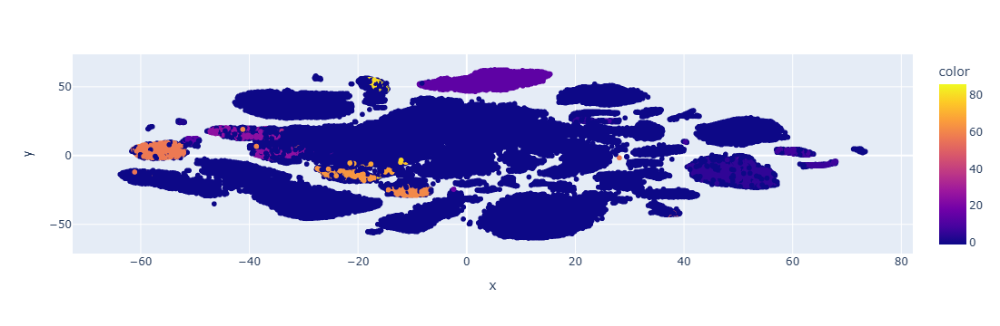

In [18]:
fig = px.scatter(x=tsne_projections[:, 0], y=tsne_projections[:, 1], color=clusters)
fig.show()


In [5]:
# Split the data
X_train, X_test, y_train, y_test = train_test_split(features_reduced, labels, test_size=0.2, random_state=42)

# Train the RandomForest classifier
clf = RandomForestClassifier(n_estimators=100, random_state=42)
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Generate the classification report with zero_division parameter
print(classification_report(y_test, y_pred, zero_division=1))

# Calculate precision, recall, and F1 score separately
precision = precision_score(y_test, y_pred, average='micro', zero_division=1)
recall = recall_score(y_test, y_pred, average='micro', zero_division=1)
f1 = f1_score(y_test, y_pred, average='micro', zero_division=1)
macro_f1 = f1_score(y_test, y_pred, average='macro', zero_division=1)
weighted_f1 = f1_score(y_test, y_pred, average='weighted', zero_division=1)

print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'Macro F1 Score: {macro_f1}')
print(f'Weighted F1 Score: {weighted_f1}')

              precision    recall  f1-score   support

           0       0.97      0.97      0.97     19205
           1       0.99      0.95      0.97      2783
           2       0.93      0.90      0.91      3214
           3       0.96      0.94      0.95      2449
           4       0.96      0.72      0.82      2273
           5       0.98      0.20      0.33       205
           6       0.97      0.95      0.96      5923
           7       0.97      0.78      0.87       320
           8       0.99      0.92      0.96       346
           9       0.95      0.96      0.95      3959

   micro avg       0.97      0.94      0.95     40677
   macro avg       0.97      0.83      0.87     40677
weighted avg       0.97      0.94      0.95     40677
 samples avg       0.96      0.94      0.92     40677

Precision: 0.9663390912314472
Recall: 0.93795019298375
F1 Score: 0.9519330330967203
Macro F1 Score: 0.8690710722200947
Weighted F1 Score: 0.9496818386031147


Silhouette Score for K-Means clustering: 0.4239759147167206


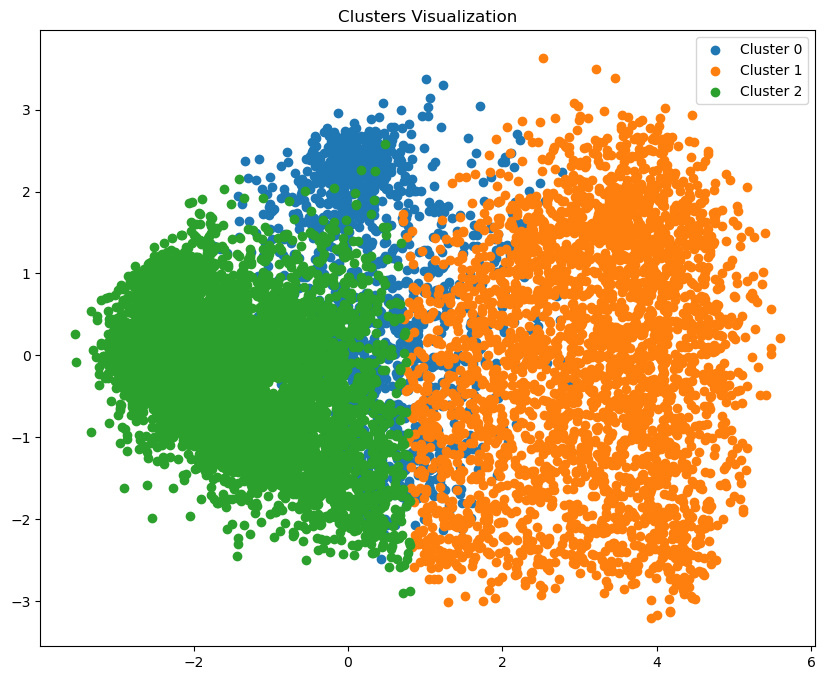

['Data/Bubble_2/images/Bubble_2 018m58s.jpg',
 'Data/Bubble_2/images/Bubble_2 007m44s.jpg',
 'Data/Bubble_2/images/Bubble_2 004m58s.jpg',
 'Data/Bubble_2/images/Bubble_2 011m09s.jpg',
 'Data/Bubble_2/images/Bubble_2 002m38s.jpg',
 'Data/Bubble_2/images/Bubble_2 005m34s.jpg',
 'Data/Bubble_2/images/Bubble_2 022m47s.jpg',
 'Data/Bubble_2/images/Bubble_2 022m27s.jpg',
 'Data/Bubble_2/images/Bubble_2 026m58s.jpg',
 'Data/Bubble_2/images/Bubble_2 008m58s.jpg',
 'Data/Bubble_2/images/Bubble_2 019m51s.jpg',
 'Data/Bubble_2/images/Bubble_2 001m29s.jpg',
 'Data/Bubble_2/images/Bubble_2 020m22s.jpg',
 'Data/Bubble_2/images/Bubble_2 018m20s.jpg',
 'Data/Bubble_2/images/Bubble_2 012m49s.jpg',
 'Data/Bubble_2/images/Bubble_2 020m51s.jpg',
 'Data/Bubble_2/images/Bubble_2 007m33s.jpg',
 'Data/Bubble_2/images/Bubble_2 009m33s.jpg',
 'Data/Bubble_2/images/Bubble_2 004m59s.jpg',
 'Data/Bubble_2/images/Bubble_2 012m54s.jpg',
 'Data/Bubble_2/images/Bubble_2 012m07s.jpg',
 'Data/Bubble_2/images/Bubble_2 00

In [41]:
# Function to filter images by class index
def filter_images_by_class(labels, class_index):
    return [i for i, label in enumerate(labels) if label[class_index] == 1]

# Function to visualize clusters
def visualize_clusters(embeddings_reduced, cluster_labels, paths):
    unique_labels = np.unique(cluster_labels)
    plt.figure(figsize=(10, 8))
    for label in unique_labels:
        mask = cluster_labels == label
        plt.scatter(embeddings_reduced[mask, 0], embeddings_reduced[mask, 1], label=f'Cluster {label}')
    plt.legend()
    plt.title('Clusters Visualization')
    plt.show()

# Function to perform the complete analysis for a given class index
def analyze_class(features, labels, class_index, image_paths):
    filtered_indices = filter_images_by_class(labels, class_index)
    embeddings = features[filtered_indices]
    paths = [image_paths[i] for i in filtered_indices]

    # Reduce dimensionality with PCA
    pca = skPCA(n_components=3)
    embeddings_reduced = pca.fit_transform(embeddings)

    # Apply K-Means clustering
    kmeans = KMeans(n_clusters=3, random_state=42)  # Adjust the number of clusters as needed
    cluster_labels = kmeans.fit_predict(embeddings_reduced)

    # Evaluate clustering
    silhouette_avg = silhouette_score(embeddings_reduced, cluster_labels)
    print(f'Silhouette Score for K-Means clustering: {silhouette_avg}')

    # Visualize the clusters
    visualize_clusters(embeddings_reduced, cluster_labels, paths)

    return paths

# Example usage
#['Object present', 'Needle-like crystal', 'Elongated crystal', 'Platelet crystal',
#                 'Regular crystal', 'Impurity', 'Agglomerated crystals', 'Bubbles', 'Droplets',
#                 'Too concentrated']
class_index = 4  # Example class index for 'Regular crystal'
image_paths_array = np.array(all_image_paths)
analyze_class(features, labels, class_index, image_paths_array)




Analyzing Class Index: 0
Cluster Count: 2
Silhouette Score: 0.45595577359199524
Calinski-Harabasz Score: 91454.61676833074
Davies-Bouldin Score: 0.8983767444478828


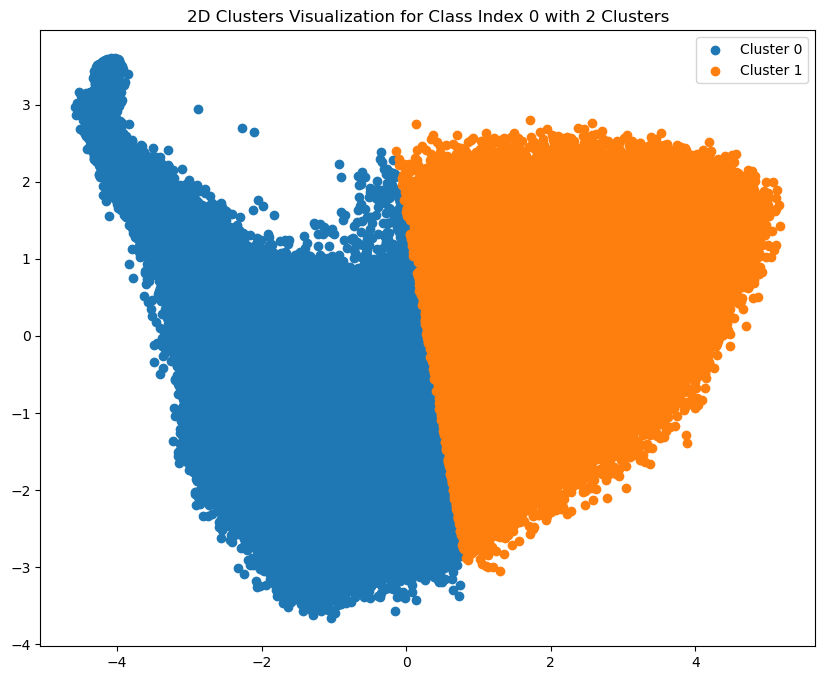

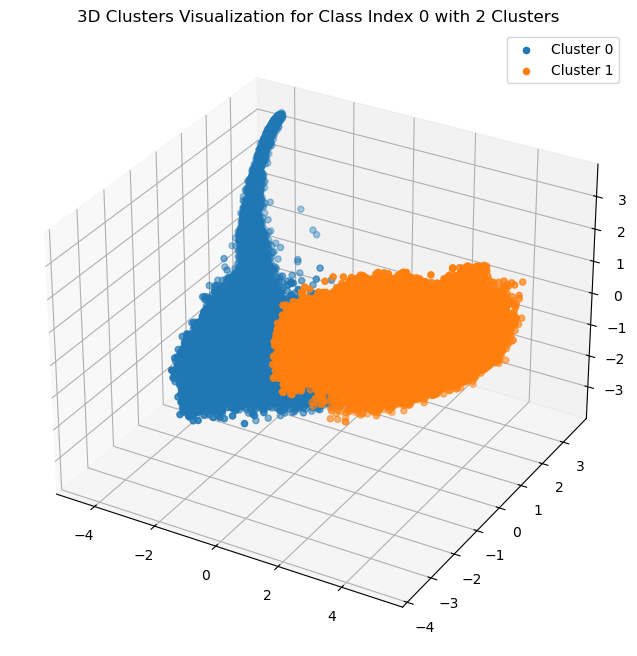

Cluster Count: 3
Silhouette Score: 0.47583600878715515
Calinski-Harabasz Score: 104696.50134136142
Davies-Bouldin Score: 0.7820494214875834


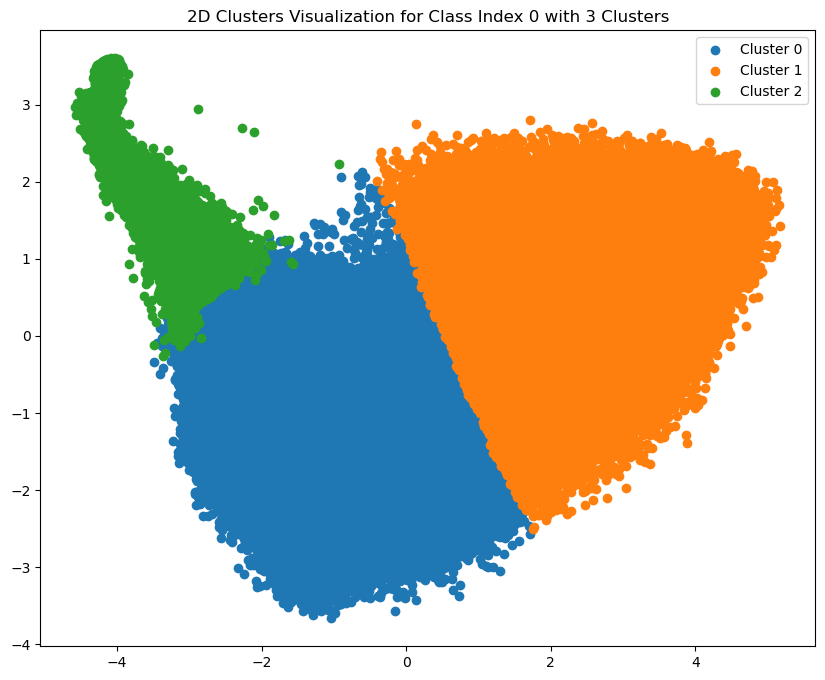

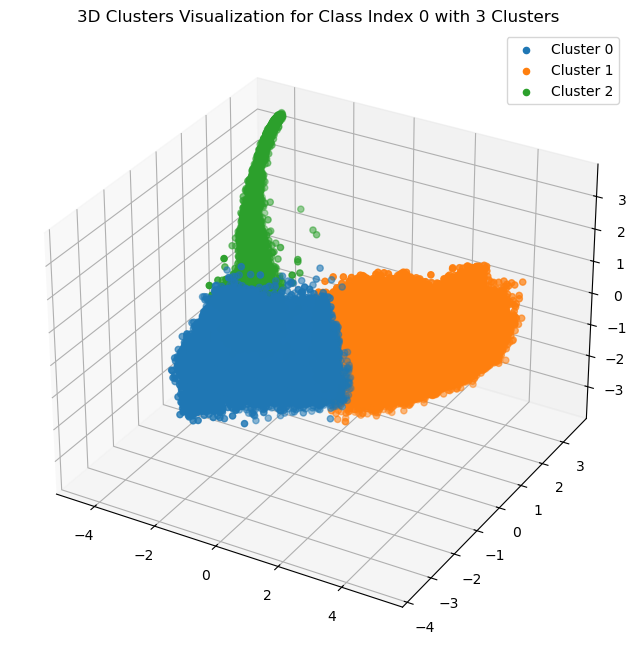

Analyzing Class Index: 1
Cluster Count: 2
Silhouette Score: 0.4531329870223999
Calinski-Harabasz Score: 13282.447242823897
Davies-Bouldin Score: 0.9189319059261026


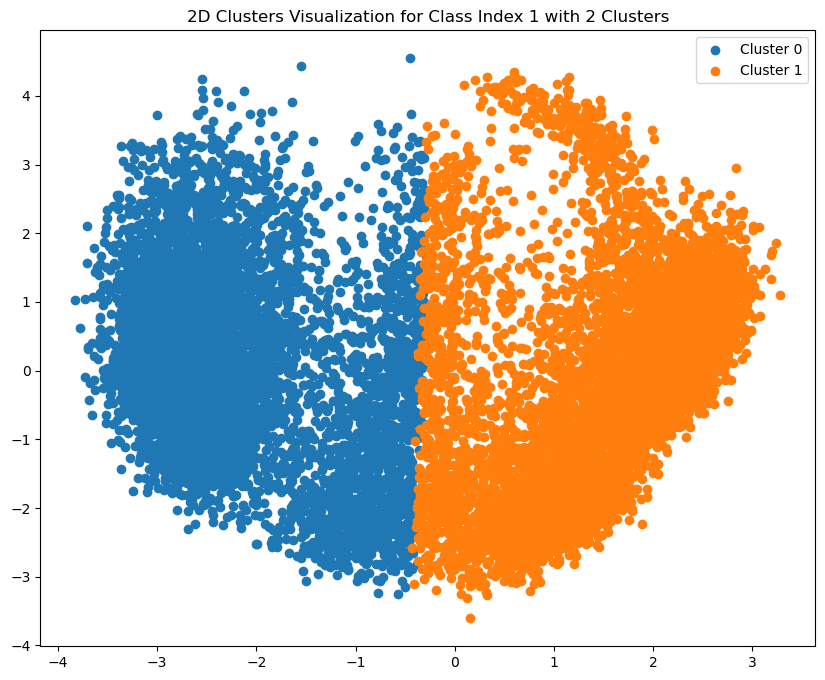

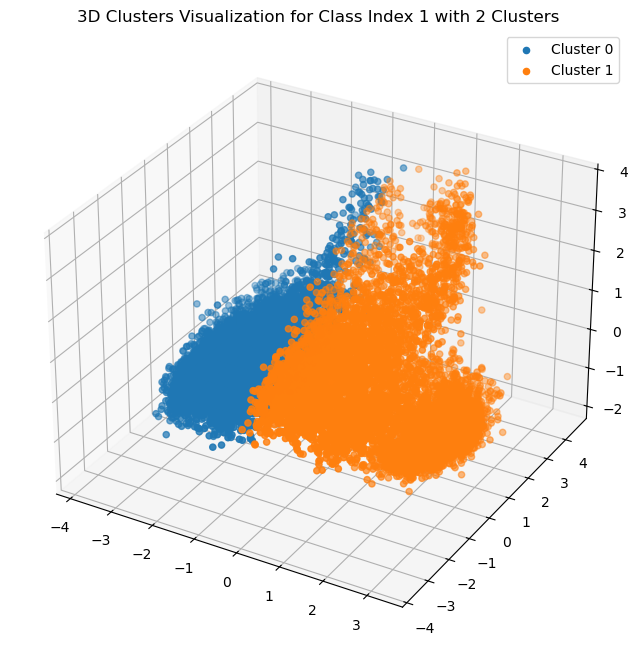

Cluster Count: 3
Silhouette Score: 0.43071645498275757
Calinski-Harabasz Score: 10463.486586260247
Davies-Bouldin Score: 1.0018339085601007


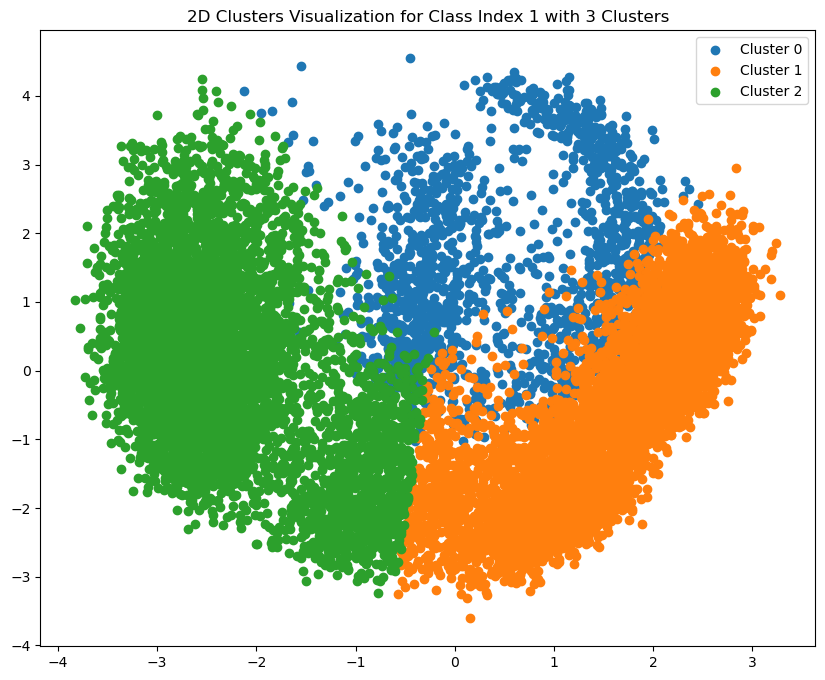

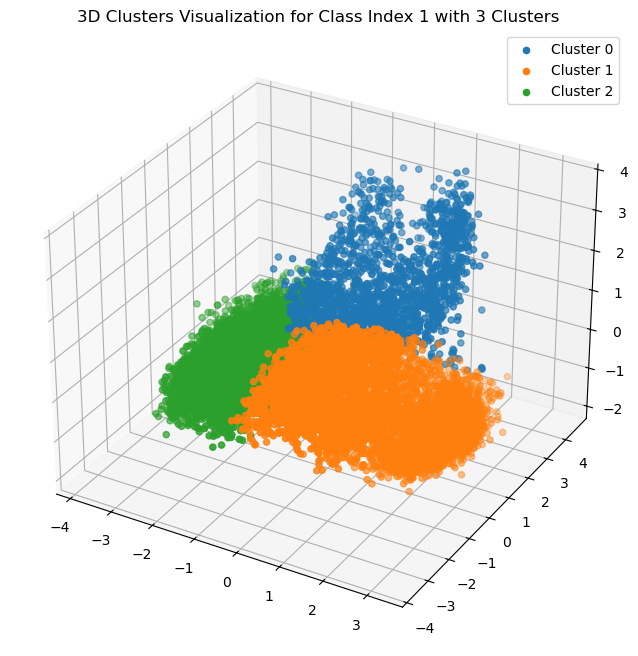

Analyzing Class Index: 2
Cluster Count: 2
Silhouette Score: 0.4736594557762146
Calinski-Harabasz Score: 14015.52996689103
Davies-Bouldin Score: 0.88755380945983


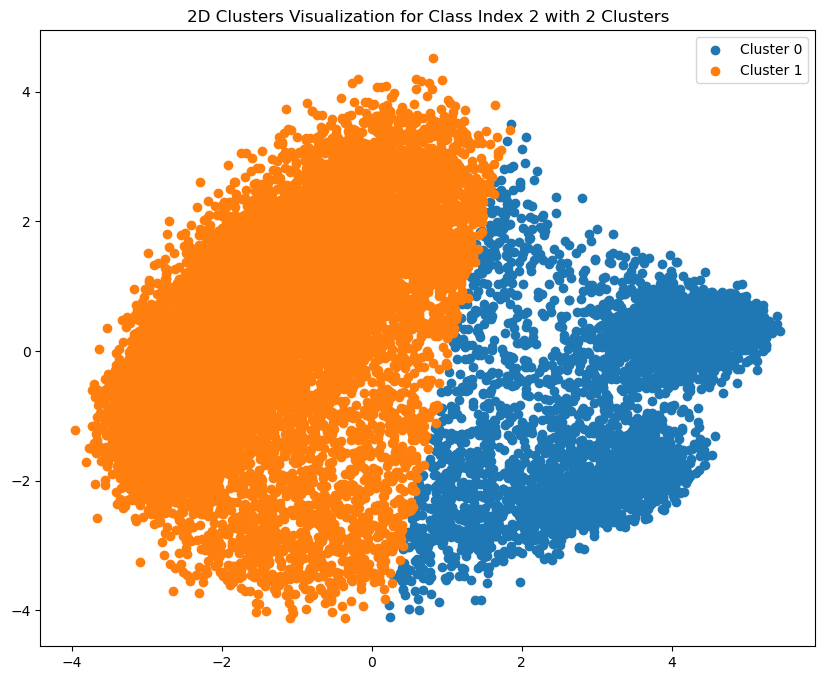

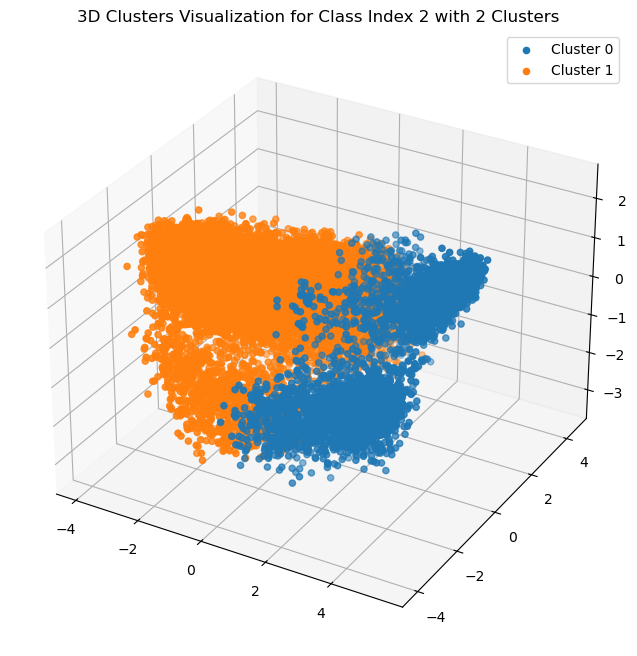

Cluster Count: 3
Silhouette Score: 0.4099270701408386
Calinski-Harabasz Score: 15123.301068918681
Davies-Bouldin Score: 0.8995675287781566


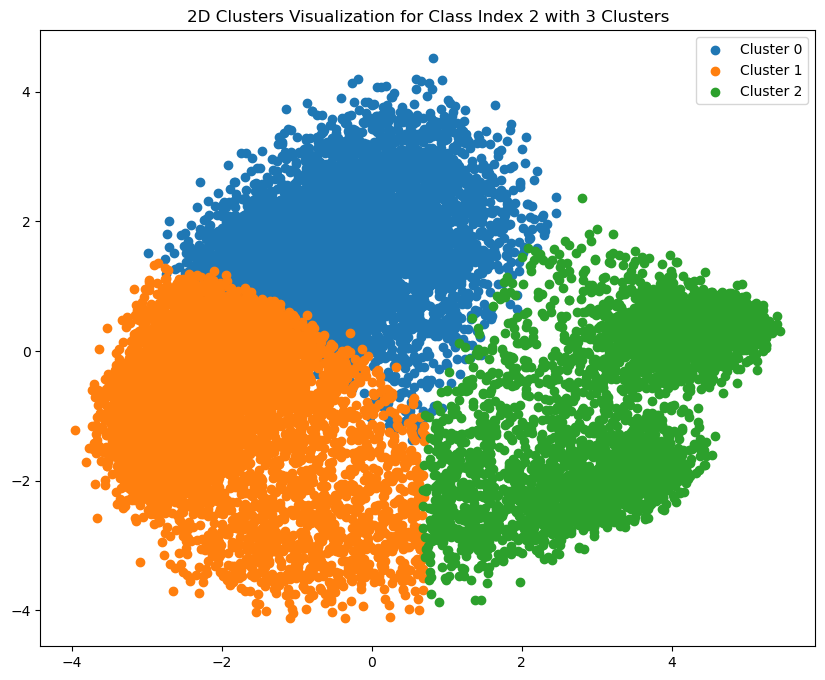

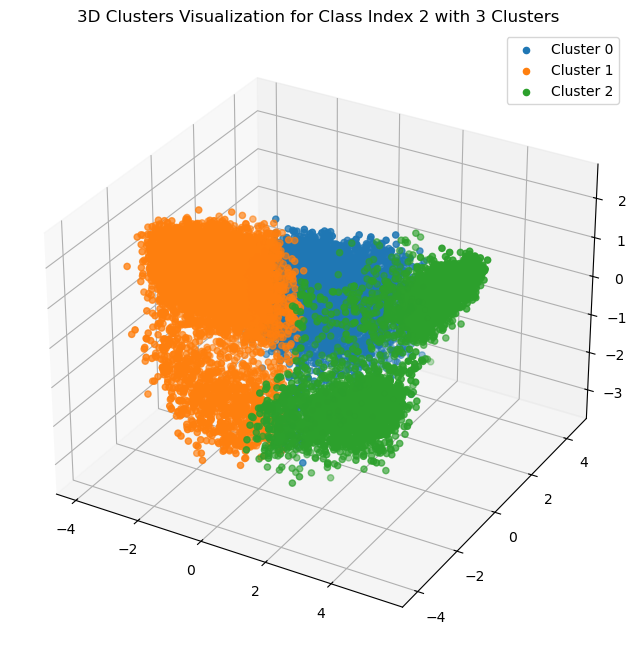

Analyzing Class Index: 3
Cluster Count: 2
Silhouette Score: 0.33216243982315063
Calinski-Harabasz Score: 6269.847640889372
Davies-Bouldin Score: 1.2397758006489805


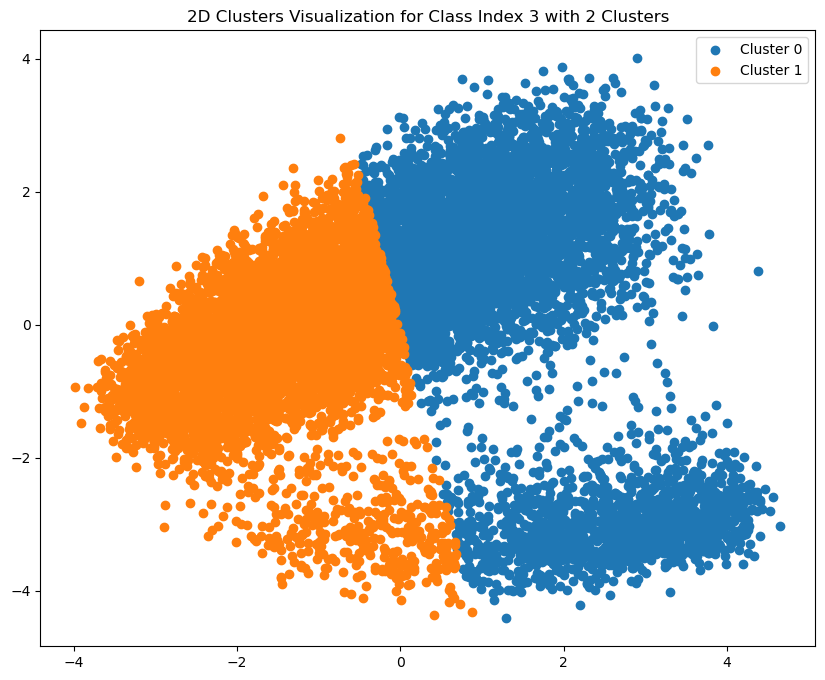

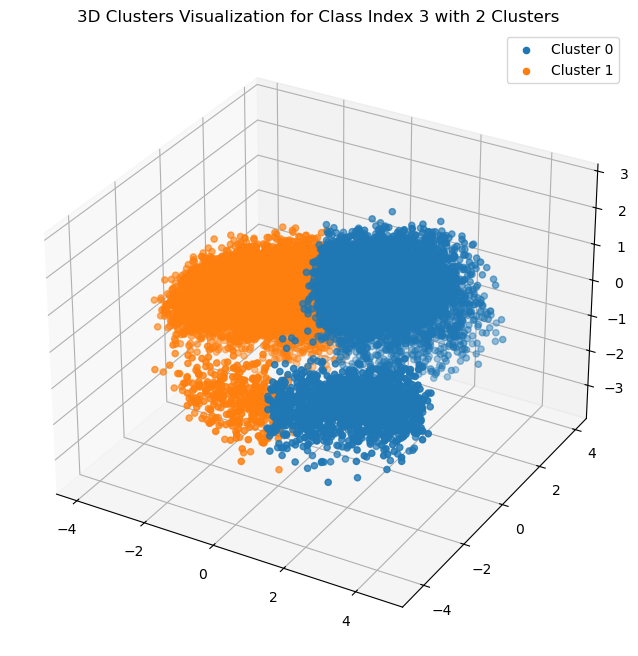

Cluster Count: 3
Silhouette Score: 0.4343656301498413
Calinski-Harabasz Score: 11451.393194331577
Davies-Bouldin Score: 0.8239219616067031


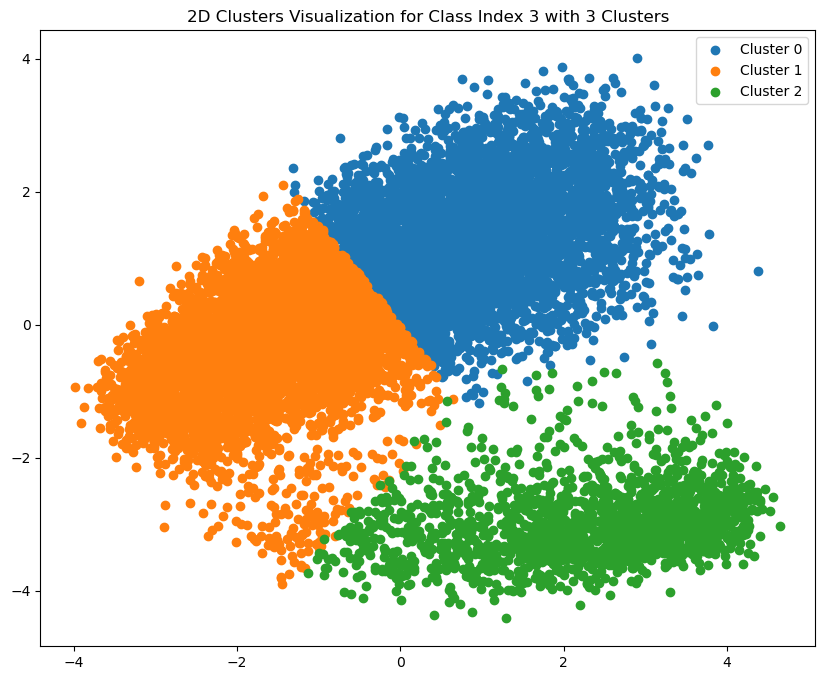

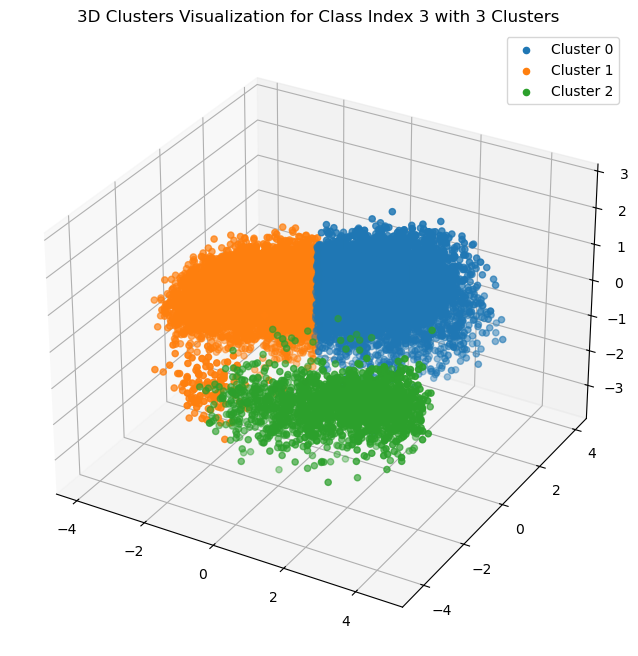

Analyzing Class Index: 4
Cluster Count: 2
Silhouette Score: 0.5063446760177612
Calinski-Harabasz Score: 13176.822385395235
Davies-Bouldin Score: 0.8136653340808666


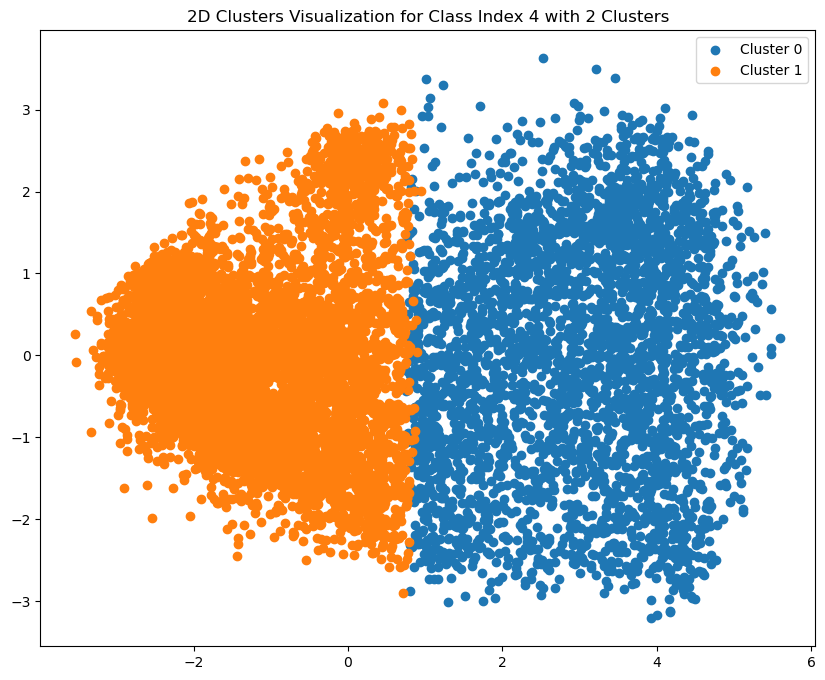

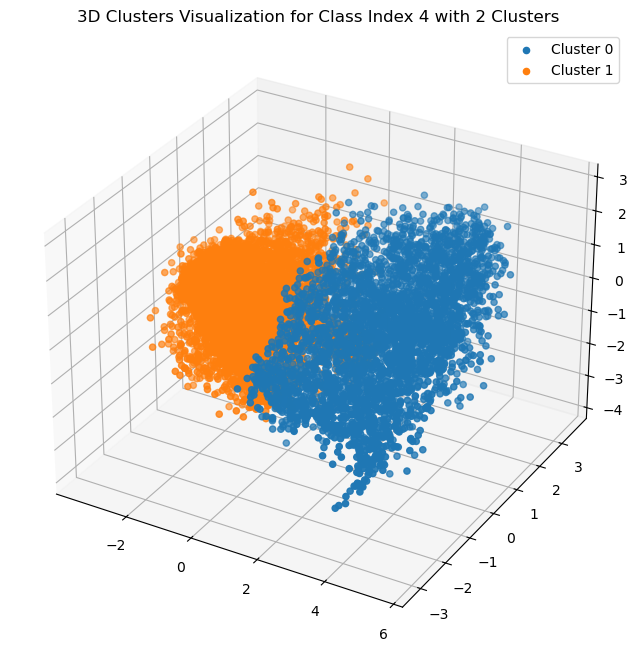

Cluster Count: 3
Silhouette Score: 0.4239759147167206
Calinski-Harabasz Score: 9748.370340325275
Davies-Bouldin Score: 1.0810002366571567


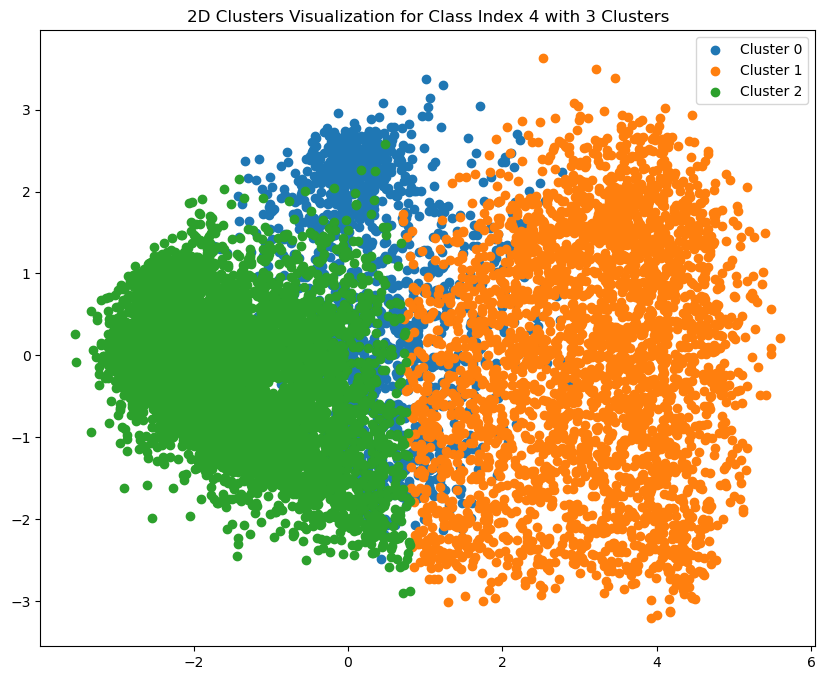

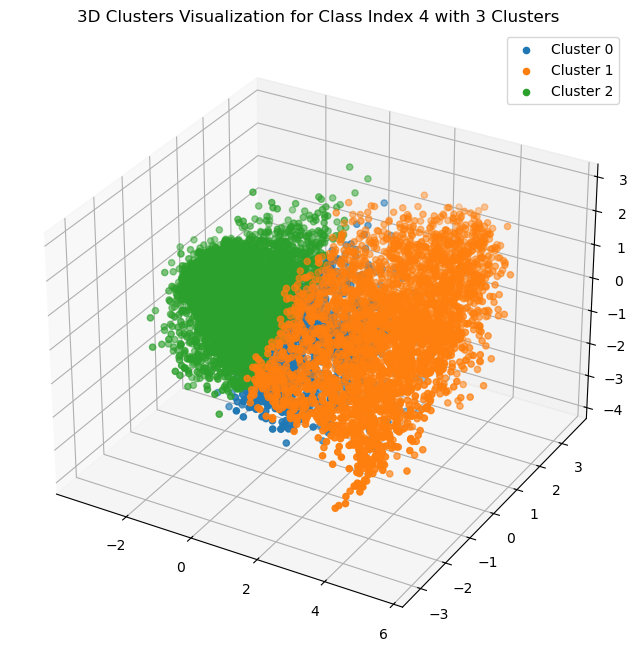

Analyzing Class Index: 5
Cluster Count: 2
Silhouette Score: 0.32746174931526184
Calinski-Harabasz Score: 563.6498374738765
Davies-Bouldin Score: 1.206946586729437


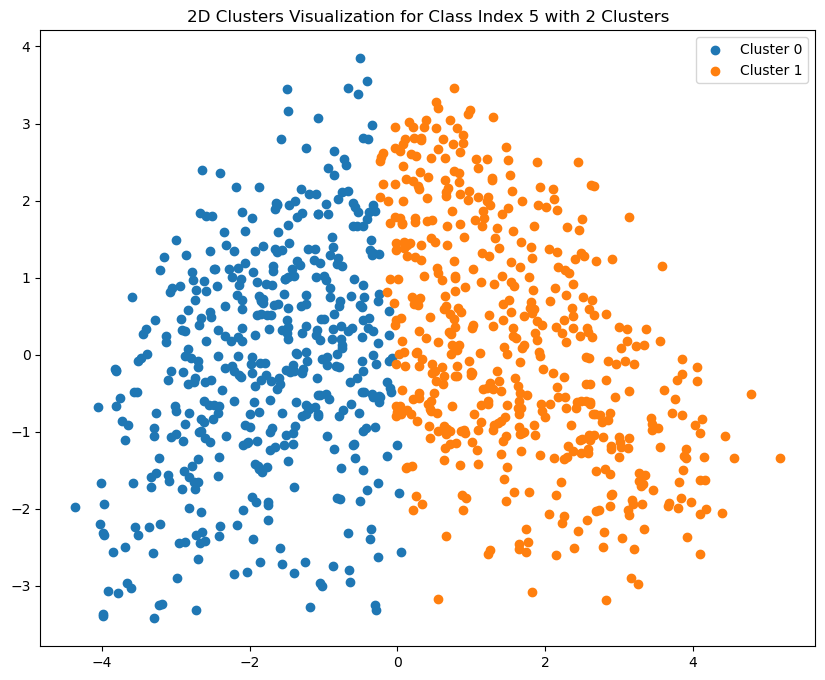

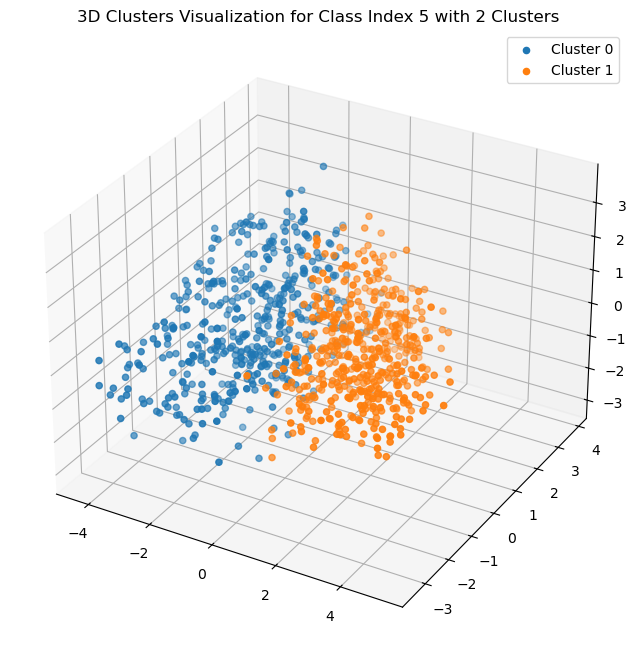

Cluster Count: 3
Silhouette Score: 0.3149808943271637
Calinski-Harabasz Score: 559.6310566005991
Davies-Bouldin Score: 1.1336410138968043


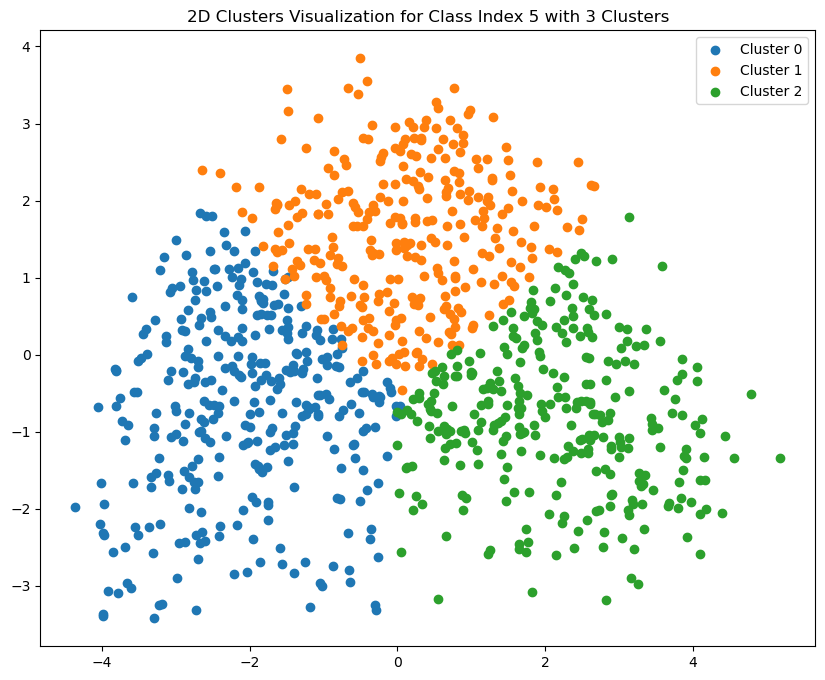

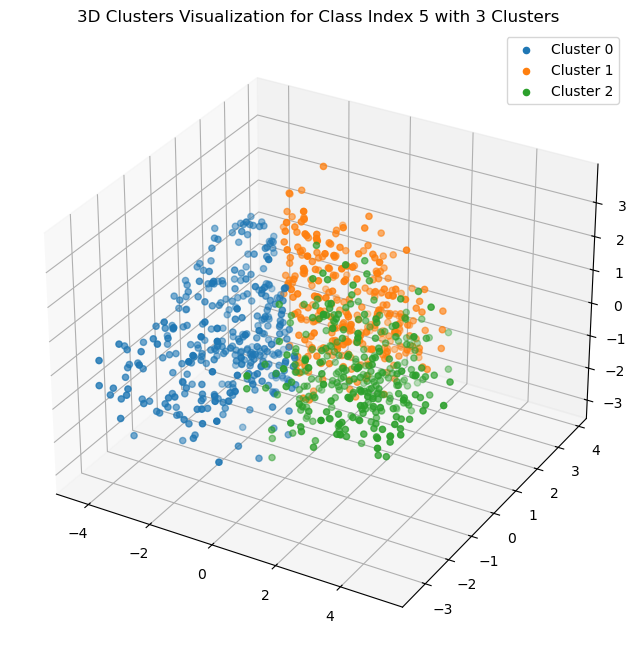

Analyzing Class Index: 6
Cluster Count: 2
Silhouette Score: 0.3596937954425812
Calinski-Harabasz Score: 15887.652285036836
Davies-Bouldin Score: 1.2773308179571032


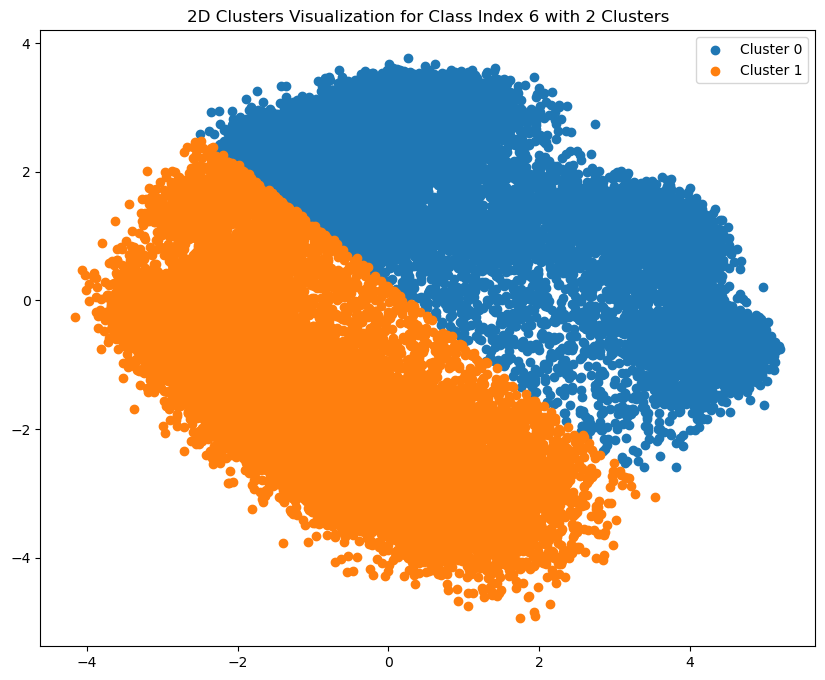

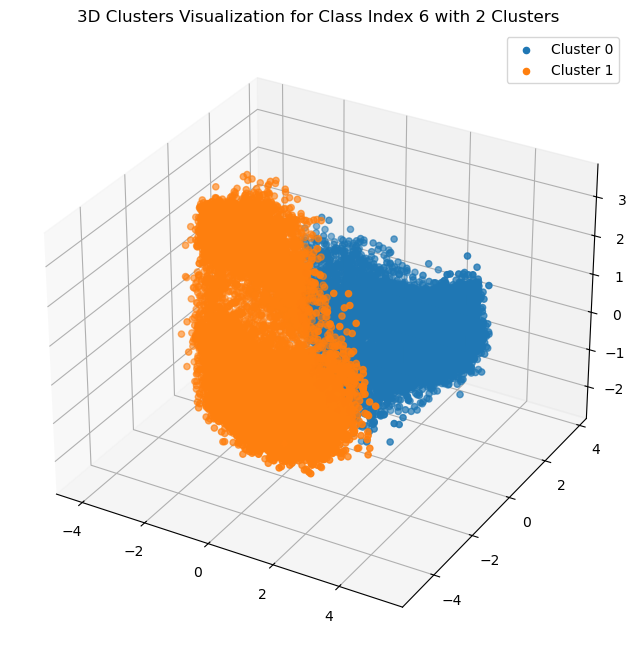

Cluster Count: 3
Silhouette Score: 0.3683035671710968
Calinski-Harabasz Score: 17993.61077373057
Davies-Bouldin Score: 1.0092028577452379


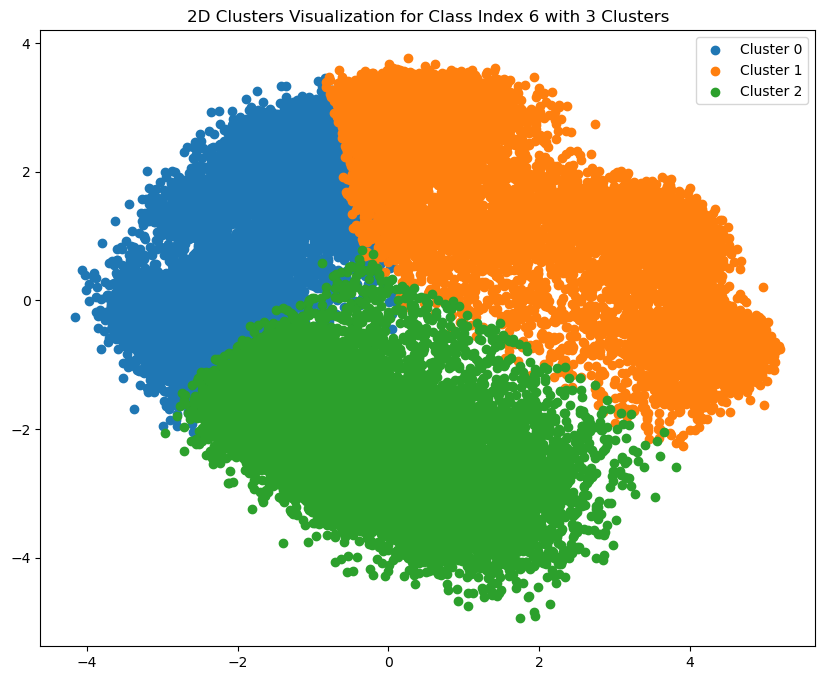

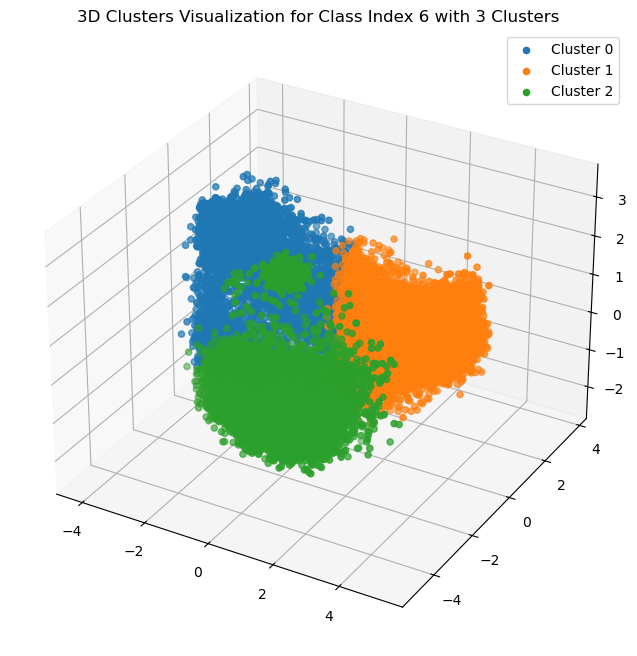

Analyzing Class Index: 7
Cluster Count: 2
Silhouette Score: 0.472250372171402
Calinski-Harabasz Score: 1354.5075760544323
Davies-Bouldin Score: 0.9784380339592313


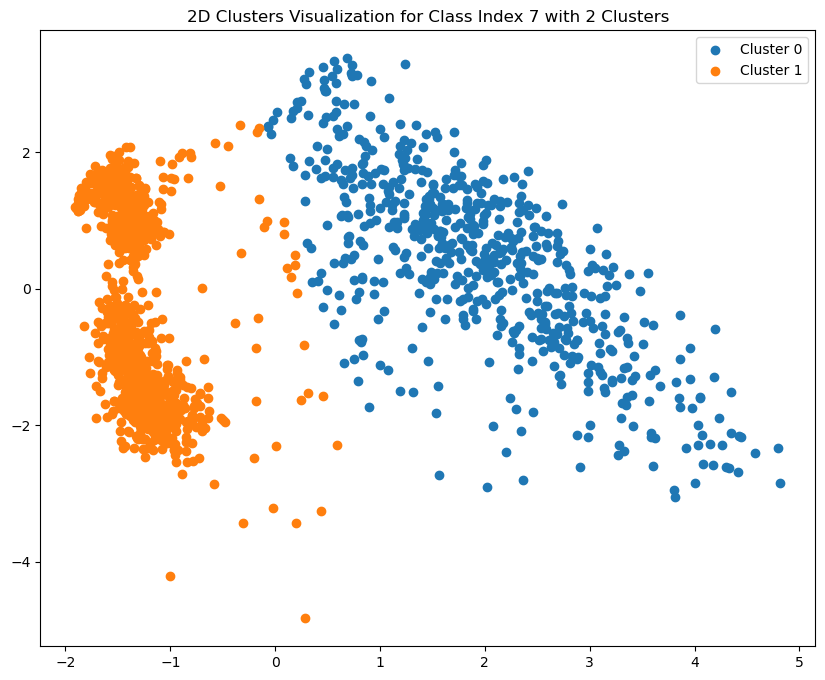

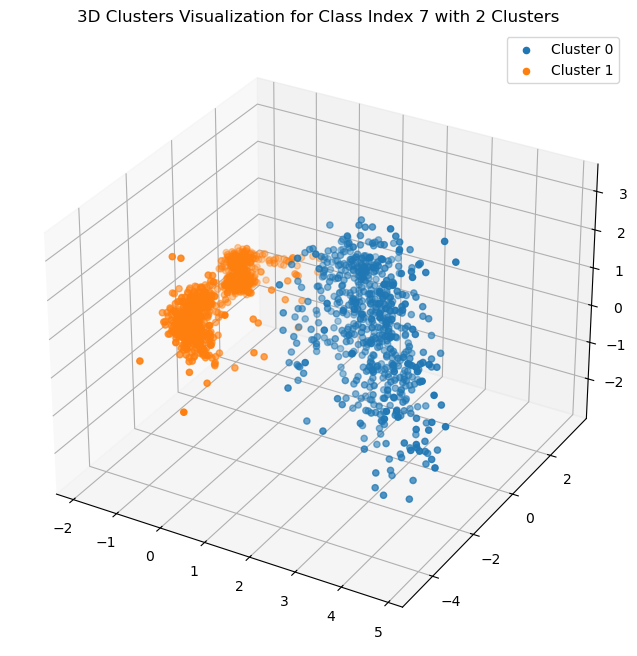

Cluster Count: 3
Silhouette Score: 0.433758407831192
Calinski-Harabasz Score: 1089.002171656743
Davies-Bouldin Score: 1.07259073601206


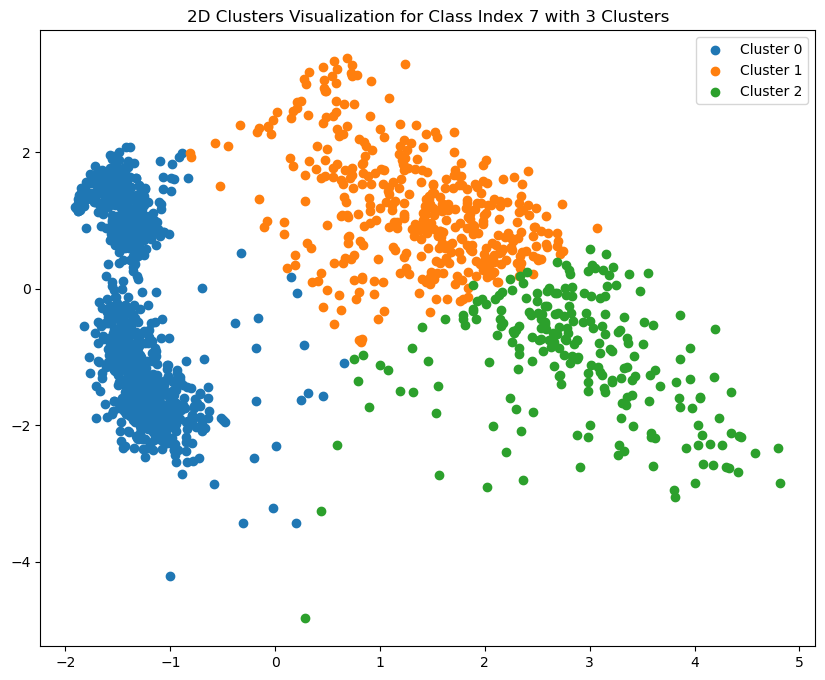

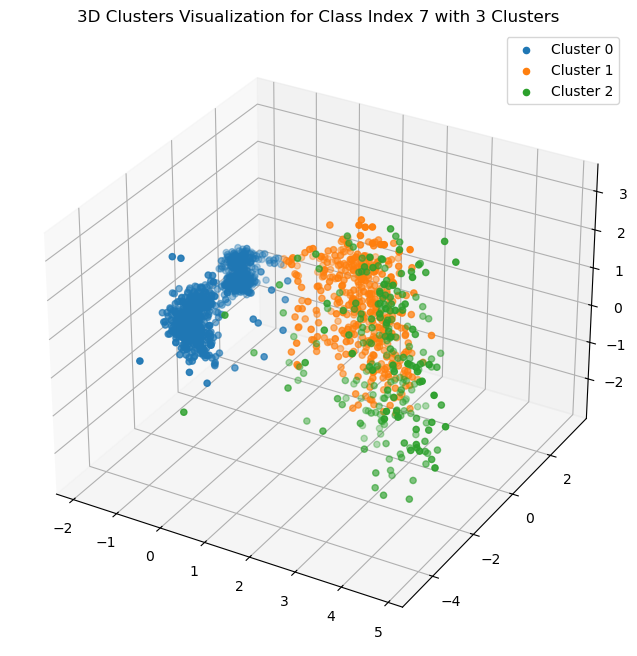

Analyzing Class Index: 8
Cluster Count: 2
Silhouette Score: 0.3481372594833374
Calinski-Harabasz Score: 1134.0715748094844
Davies-Bouldin Score: 1.1592191441978252


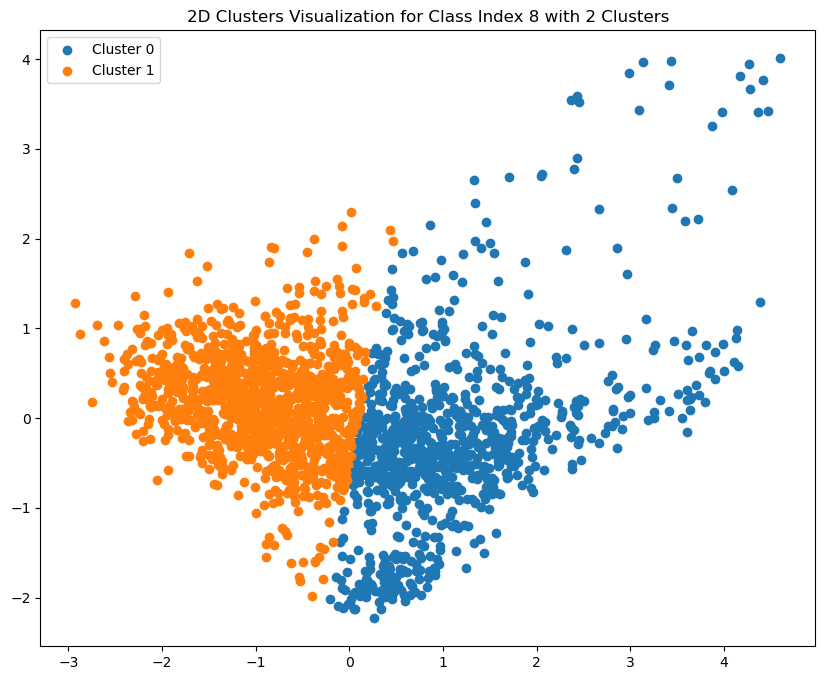

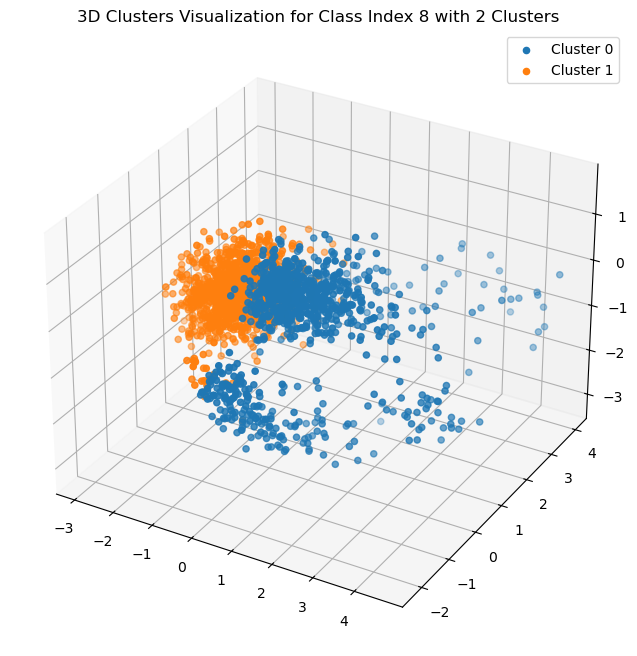

Cluster Count: 3
Silhouette Score: 0.33830583095550537
Calinski-Harabasz Score: 1078.0124869976687
Davies-Bouldin Score: 1.0950510933739472


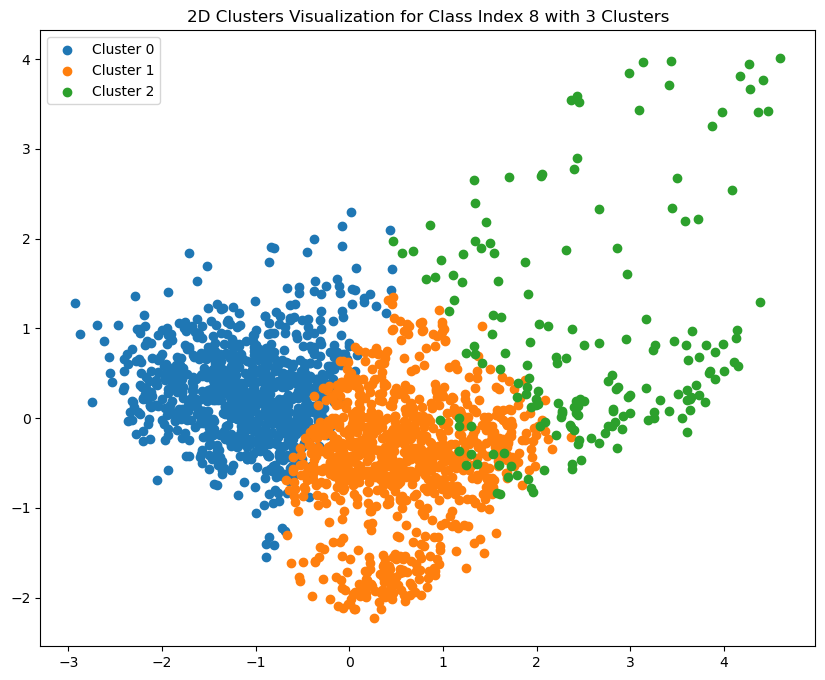

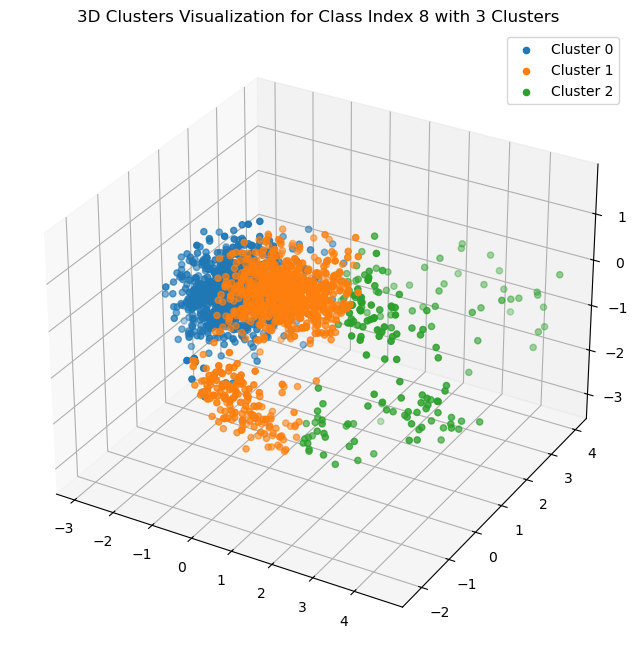

Analyzing Class Index: 9
Cluster Count: 2
Silhouette Score: 0.5846400856971741
Calinski-Harabasz Score: 28330.379190799475
Davies-Bouldin Score: 0.5073164019785826


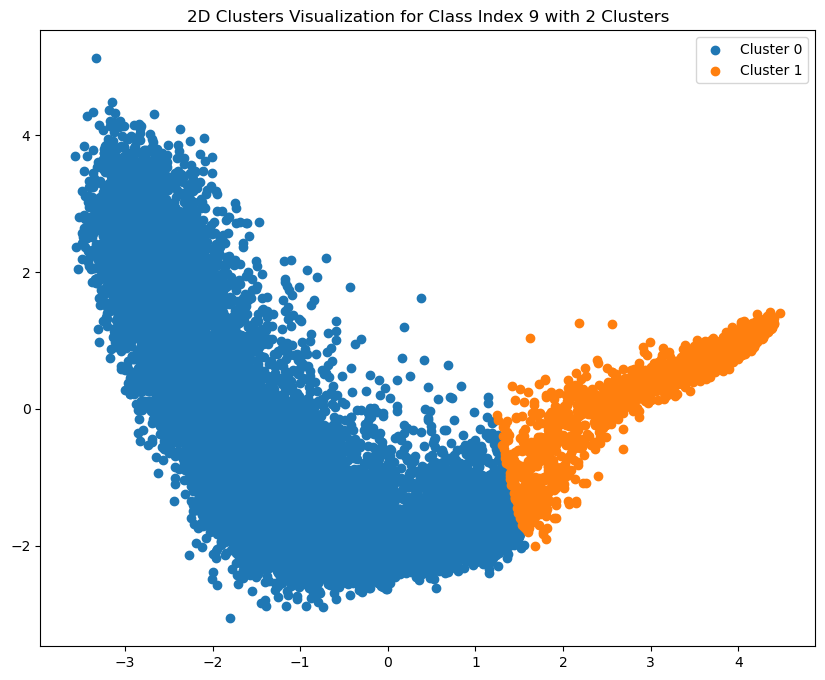

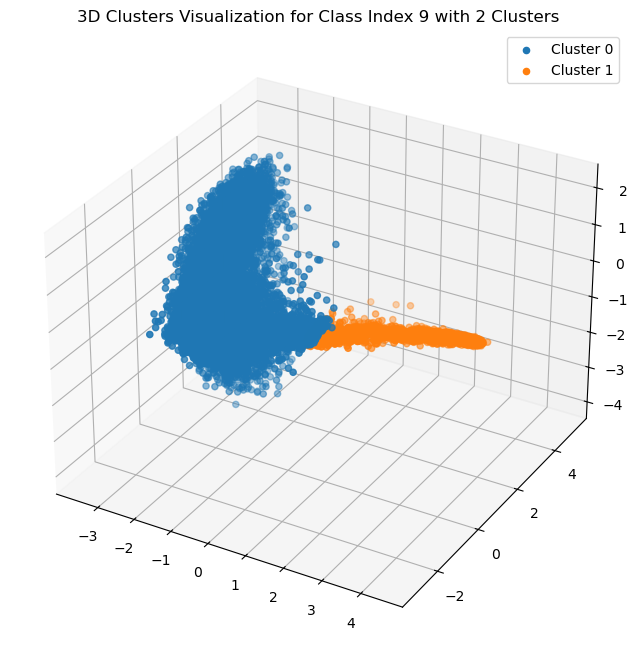

Cluster Count: 3
Silhouette Score: 0.5738572478294373
Calinski-Harabasz Score: 44570.59970899442
Davies-Bouldin Score: 0.6327020591401129


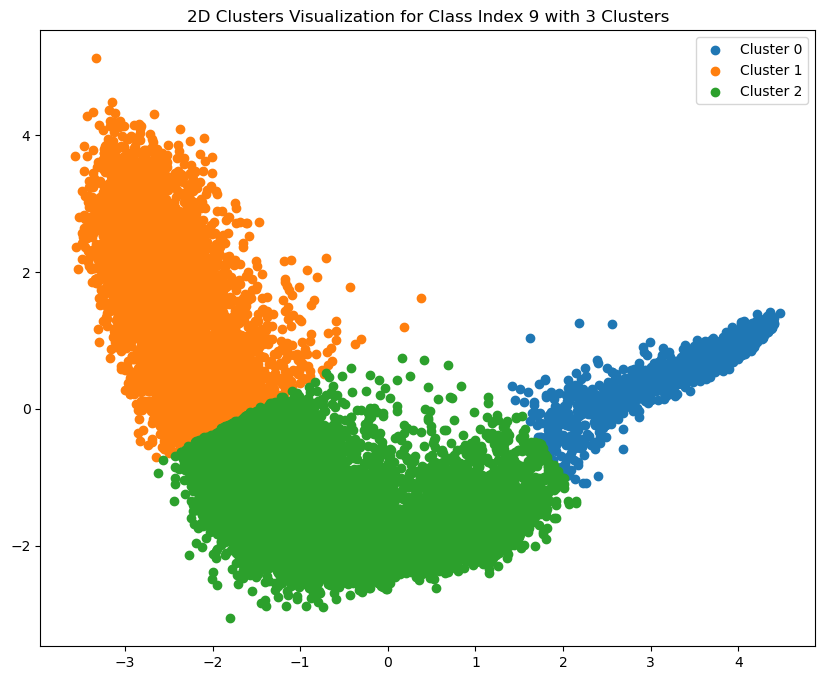

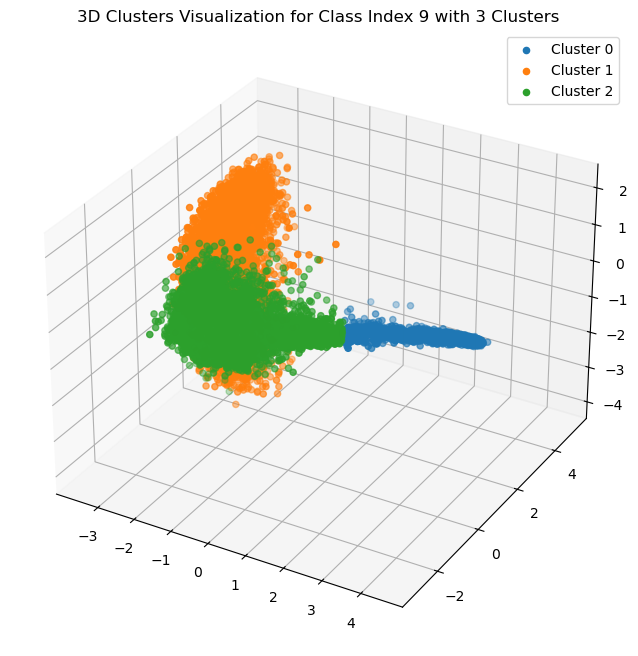

In [42]:


# Function to filter images by class index
def filter_images_by_class(labels, class_index):
    return [i for i, label in enumerate(labels) if label[class_index] == 1]

# Function to visualize clusters in 2D
def visualize_clusters_2d(embeddings_reduced, cluster_labels, paths, title):
    unique_labels = np.unique(cluster_labels)
    plt.figure(figsize=(10, 8))
    for label in unique_labels:
        mask = cluster_labels == label
        plt.scatter(embeddings_reduced[mask, 0], embeddings_reduced[mask, 1], label=f'Cluster {label}')
    plt.legend()
    plt.title(title)
    plt.show()

# Function to visualize clusters in 3D
def visualize_clusters_3d(embeddings_reduced, cluster_labels, paths, title):
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    unique_labels = np.unique(cluster_labels)
    for label in unique_labels:
        mask = cluster_labels == label
        ax.scatter(embeddings_reduced[mask, 0], embeddings_reduced[mask, 1], embeddings_reduced[mask, 2], label=f'Cluster {label}')
    ax.legend()
    ax.set_title(title)
    plt.show()

# Function to perform the complete analysis for a given class index
def analyze_class(features, labels, class_index, image_paths, n_clusters):
    filtered_indices = filter_images_by_class(labels, class_index)
    embeddings = features[filtered_indices]
    paths = [image_paths[i] for i in filtered_indices]

    # Reduce dimensionality with PCA
    pca = skPCA(n_components=3)
    embeddings_reduced = pca.fit_transform(embeddings)

    # Apply K-Means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42)
    cluster_labels = kmeans.fit_predict(embeddings_reduced)

    # Evaluate clustering with various metrics
    silhouette_avg = silhouette_score(embeddings_reduced, cluster_labels)
    calinski_harabasz_avg = calinski_harabasz_score(embeddings_reduced, cluster_labels)
    davies_bouldin_avg = davies_bouldin_score(embeddings_reduced, cluster_labels)
    print(f'Cluster Count: {n_clusters}')
    print(f'Silhouette Score: {silhouette_avg}')
    print(f'Calinski-Harabasz Score: {calinski_harabasz_avg}')
    print(f'Davies-Bouldin Score: {davies_bouldin_avg}')

    # Visualize the clusters
    title_2d = f'2D Clusters Visualization for Class Index {class_index} with {n_clusters} Clusters'
    title_3d = f'3D Clusters Visualization for Class Index {class_index} with {n_clusters} Clusters'
    visualize_clusters_2d(embeddings_reduced[:, :2], cluster_labels, paths, title_2d)
    visualize_clusters_3d(embeddings_reduced, cluster_labels, paths, title_3d)

    return paths

# Main loop to analyze all classes and clusters
image_paths_array = np.array(all_image_paths)
n_classes = labels.shape[1]
for class_index in range(n_classes):
    print(f'Analyzing Class Index: {class_index}')
    for n_clusters in range(2, 4):
        analyze_class(features, labels, class_index, image_paths_array, n_clusters)


In [43]:

from sklearn.metrics import calinski_harabasz_score, davies_bouldin_score

def compute_single_cluster_metrics(features):
    # All points in one cluster
    single_cluster_labels = np.zeros(features.shape[0], dtype=int)

    # Compute the metrics
    silhouette_avg = silhouette_score(features, single_cluster_labels)
    calinski_harabasz = calinski_harabasz_score(features, single_cluster_labels)
    davies_bouldin = davies_bouldin_score(features, single_cluster_labels)

    return silhouette_avg, calinski_harabasz, davies_bouldin


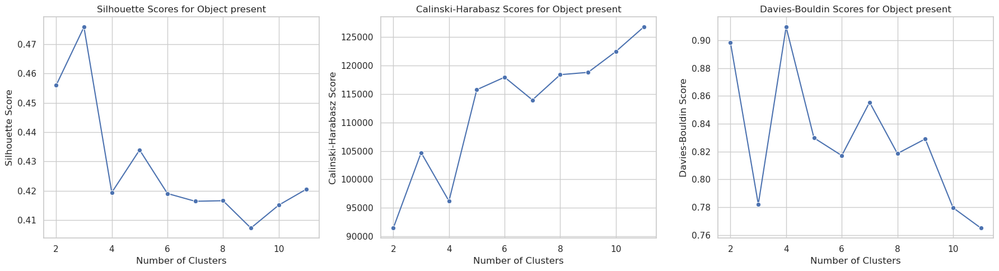

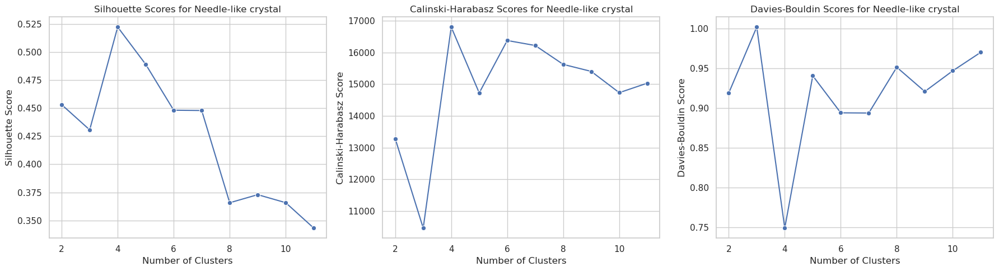

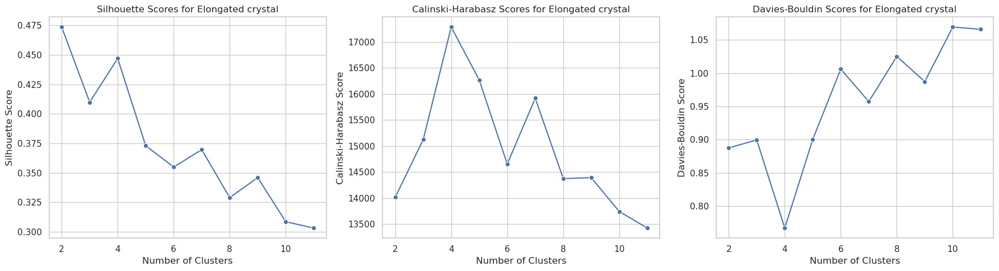

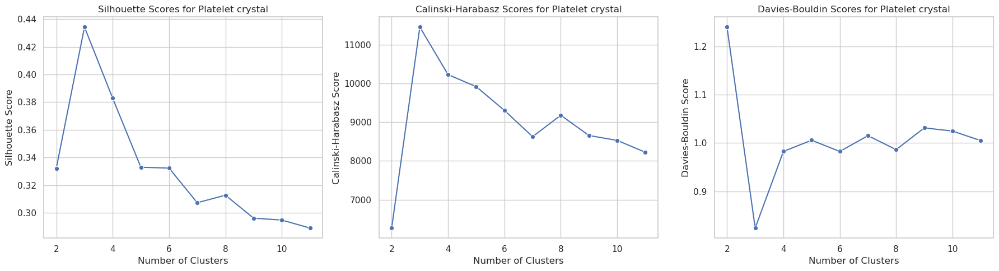

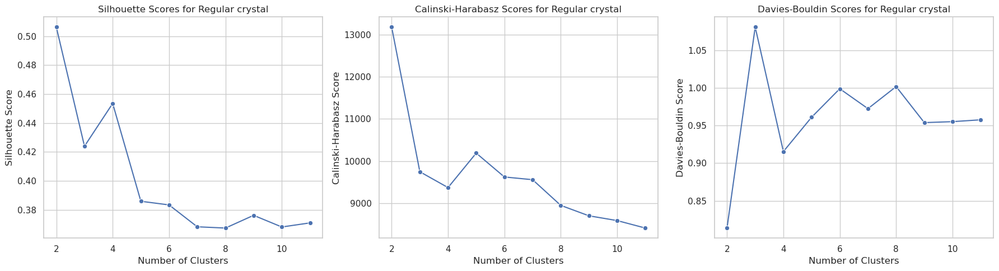

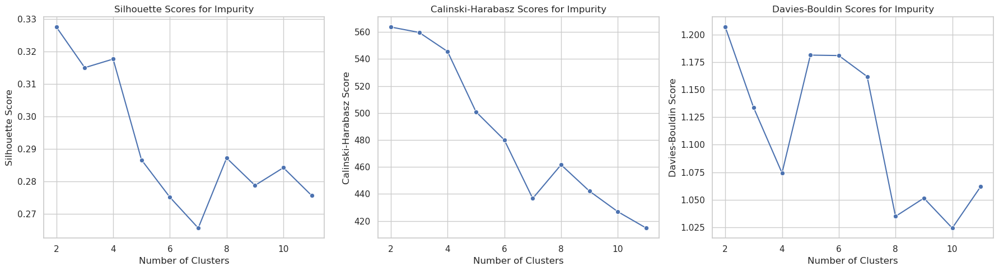

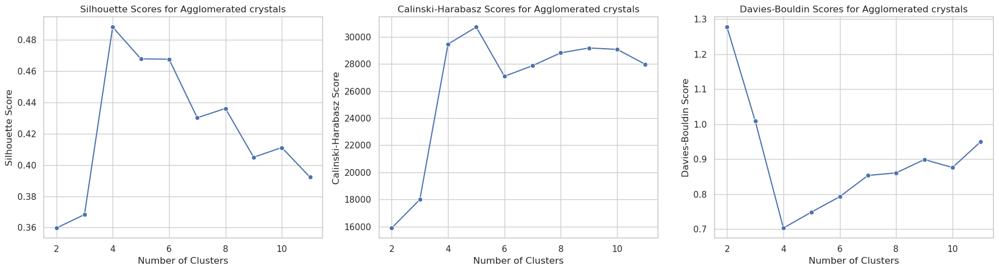

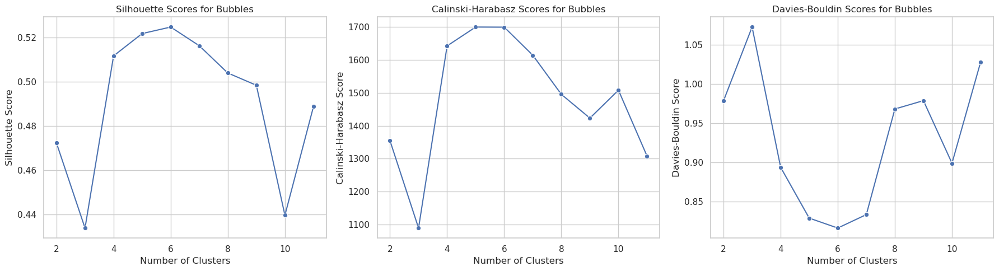

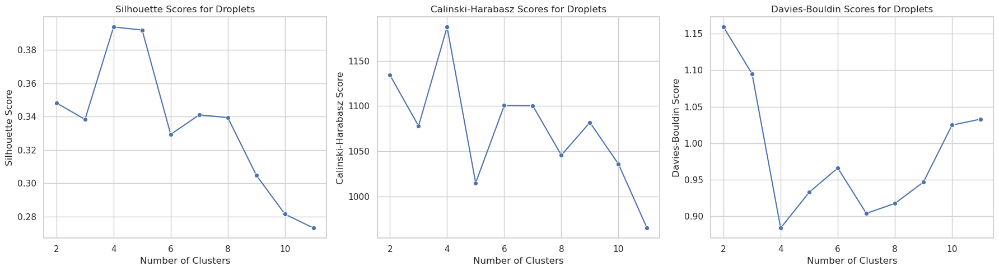

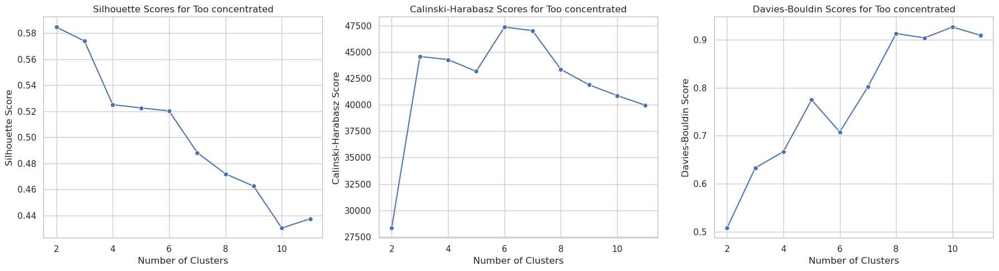

In [82]:
results = {
    'Object present': [
        (2, 0.45595577359199524, 91454.61676833074, 0.8983767444478828),
        (3, 0.47583600878715515, 104696.50134136142, 0.7820494214875834),
        (4, 0.41940823197364807, 96195.94090478968, 0.9096383287300553),
        (5, 0.433921754360199, 115746.33671309185, 0.8298588177886768),
        (6, 0.41906362771987915, 117938.63384822926, 0.8171110506121879),
        (7, 0.41641169786453247, 113943.29845594394, 0.855504424859242),
        (8, 0.4166058599948883, 118383.54070341717, 0.8185741895576014),
        (9, 0.4072797894477844, 118787.562191337, 0.8290794145728462),
        (10, 0.4150962829589844, 122450.52534271844, 0.7795690673127895),
        (11, 0.42056772112846375, 126745.72452306382, 0.7649381061385395),
    ],
    'Needle-like crystal': [
        (2, 0.4531329870223999, 13282.447242823897, 0.9189319059261026),
        (3, 0.43071645498275757, 10463.486586260247, 1.0018339085601007),
        (4, 0.5223102569580078, 16800.010481707788, 0.749387494781147),
        (5, 0.489088773727417, 14723.168996547069, 0.9406136586528013),
        (6, 0.4482068717479706, 16375.595611975357, 0.8941028034931334),
        (7, 0.4479489326477051, 16217.921206566874, 0.8938602204435869),
        (8, 0.3657509684562683, 15622.200408855548, 0.9513334060333698),
        (9, 0.37295299768447876, 15401.513522165591, 0.9208775466829883),
        (10, 0.3658115565776825, 14731.215533388195, 0.9468867413940558),
        (11, 0.3432071805000305, 15030.294179900297, 0.9701370044011255),
    ],
    'Elongated crystal': [
        (2, 0.4736594557762146, 14015.52996689103, 0.88755380945983),
        (3, 0.4099270701408386, 15123.301068918681, 0.8995675287781566),
        (4, 0.44701746106147766, 17281.96979484182, 0.766996692340276),
        (5, 0.3730287551879883, 16266.363585670779, 0.9003974066053267),
        (6, 0.3549340069293976, 14654.845134491668, 1.0061725264084818),
        (7, 0.36966750025749207, 15915.843479205752, 0.9572296415974005),
        (8, 0.3290211260318756, 14375.687404209555, 1.0252355735861782),
        (9, 0.3460000157356262, 14392.43664091926, 0.9873487805634612),
        (10, 0.30857035517692566, 13744.541075390207, 1.069403551438338),
        (11, 0.303207129240036, 13426.408568791201, 1.0659855627431951),
    ],
    'Platelet crystal': [
        (2, 0.33216243982315063, 6269.847640889372, 1.2397758006489805),
        (3, 0.4343656301498413, 11451.393194331577, 0.8239219616067031),
        (4, 0.38283973932266235, 10224.944105661298, 0.9823958313942636),
        (5, 0.3329066038131714, 9915.059434966037, 1.0055892548754644),
        (6, 0.33229225873947144, 9302.58384858229, 0.982391731970894),
        (7, 0.30722635984420776, 8625.73120687598, 1.0150345351742254),
        (8, 0.3126753568649292, 9177.783232255768, 0.9861645377618076),
        (9, 0.2960345149040222, 8654.942466505414, 1.0311544415661116),
        (10, 0.2947010397911072, 8530.118757815882, 1.024592802473127),
        (11, 0.2889021337032318, 8223.197127151238, 1.0048565099113418),
    ],
    'Regular crystal': [
        (2, 0.5063446760177612, 13176.822385395235, 0.8136653340808666),
        (3, 0.4239759147167206, 9748.370340325275, 1.0810002366571567),
        (4, 0.45353662967681885, 9373.658645354652, 0.9154123271092426),
        (5, 0.3859238922595978, 10189.970657811551, 0.9610365156946911),
        (6, 0.38340556621551514, 9624.58460403942, 0.9989060597366252),
        (7, 0.368291974067688, 9560.221047428617, 0.9724705836029564),
        (8, 0.36741307377815247, 8951.369175070977, 1.0018015755364655),
        (9, 0.3762095868587494, 8704.536537817494, 0.9538759434462781),
        (10, 0.36815163493156433, 8591.449866254708, 0.9551799692034406),
        (11, 0.3709813058376312, 8414.526197921075, 0.9576216950159812),
    ],
    'Impurity': [
        (2, 0.32746171951293945, 563.6496847953129, 1.2069466826168966),
        (3, 0.3149808347225189, 559.6306316508352, 1.133641178510149),
        (4, 0.31762412190437317, 545.5170230578639, 1.0743095629163213),
        (5, 0.28667113184928894, 500.8866875998182, 1.1814388231319919),
        (6, 0.27520790696144104, 480.01046629222134, 1.1810360735451473),
        (7, 0.2657300531864166, 436.6626361658465, 1.1619958682961584),
        (8, 0.28723016381263733, 461.5866127359793, 1.0348847834375108),
        (9, 0.27883216738700867, 442.09330285176486, 1.0514666828783197),
        (10, 0.28426608443260193, 426.85443815402175, 1.0242743270767043),
        (11, 0.27570396661758423, 414.7212620210206, 1.061902556308956),
    ],
    'Agglomerated crystals': [
        (2, 0.3596937954425812, 15887.652285036836, 1.2773308179571032),
        (3, 0.3683035671710968, 17993.61077373057, 1.0092028577452379),
        (4, 0.4881909191608429, 29468.42884323299, 0.7034610419078949),
        (5, 0.4678424298763275, 30728.766357113323, 0.7492077319350106),
        (6, 0.4676303267478943, 27089.615147875058, 0.7930675149217504),
        (7, 0.43017882108688354, 27878.006081889565, 0.8536489394882828),
        (8, 0.4361577033996582, 28824.763635227126, 0.8609710395463006),
        (9, 0.404955118894577, 29182.46672158111, 0.8990265324227589),
        (10, 0.41115644574165344, 29078.979238513493, 0.8762819172591574),
        (11, 0.392221063375473, 27975.385842528645, 0.9501782447744326),
    ],
    'Bubbles': [
        (2, 0.47225022315979004, 1354.506336106943, 0.9784384300398569),
        (3, 0.433758407831192, 1089.0024776357375, 1.0725909152877702),
        (4, 0.51163250207901, 1642.7927111889028, 0.8935194054607881),
        (5, 0.5217341780662537, 1700.2074752091544, 0.8286915393233356),
        (6, 0.524694561958313, 1699.8074476238207, 0.8159834393272956),
        (7, 0.5162400007247925, 1614.5963927217877, 0.833150706055717),
        (8, 0.5039076805114746, 1495.5787350023425, 0.9679706834684321),
        (9, 0.4983553886413574, 1423.29775005937, 0.9786284999094396),
        (10, 0.4395650625228882, 1508.218237194672, 0.8987451257988951),
        (11, 0.488690584897995, 1308.0318044663068, 1.0275248023158638),
    ],
    'Droplets': [
        (2, 0.3481372892856598, 1134.0726007562425, 1.1592186866255771),
        (3, 0.3383059501647949, 1078.0132184210074, 1.0950510552559214),
        (4, 0.39367547631263733, 1187.2287015430722, 0.8836258931858828),
        (5, 0.3919125199317932, 1015.2375435254178, 0.9327146381461298),
        (6, 0.32929491996765137, 1100.6124457994172, 0.9659745750451897),
        (7, 0.3410055935382843, 1100.4330729874603, 0.9037537167789311),
        (8, 0.339356392621994, 1045.842781188141, 0.9173621696854016),
        (9, 0.30477505922317505, 1081.9910064924484, 0.9466582456467726),
        (10, 0.28147026896476746, 1036.059466501417, 1.0247233720705606),
        (11, 0.27311739325523376, 965.4348715762752, 1.0329145748367974),
    ],
    'Too concentrated': [
        (2, 0.5846400856971741, 28330.379190799475, 0.5073164019785826),
        (3, 0.5738572478294373, 44570.59970899442, 0.6327020591401129),
        (4, 0.5250328183174133, 44268.518950573816, 0.6668568516361638),
        (5, 0.5225539207458496, 43158.93296888109, 0.7749232600177811),
        (6, 0.520257830619812, 47353.44529075547, 0.7079218992271791),
        (7, 0.48817363381385803, 47009.05702335127, 0.8022332161942705),
        (8, 0.47189417481422424, 43349.968312964666, 0.9133550107836825),
        (9, 0.4624587893486023, 41884.92119077664, 0.9040543490431544),
        (10, 0.4302915036678314, 40868.89324030264, 0.9268296184322959),
        (11, 0.43740618228912354, 39957.21012929186, 0.9093944939847245),
    ]
}


def plot_metrics(all_results, class_labels):
    sns.set(style="whitegrid")

    for class_name in class_labels:
        if class_name not in all_results:
            print(f"Warning: Class '{class_name}' not found in results.")
            continue

        results = all_results[class_name]
        cluster_counts = [r[0] for r in results]
        silhouette_scores = [r[1] for r in results]
        calinski_harabasz_scores = [r[2] for r in results]
        davies_bouldin_scores = [r[3] for r in results]

        fig, axes = plt.subplots(1, 3, figsize=(18, 5))

        sns.lineplot(x=cluster_counts, y=silhouette_scores, marker='o', ax=axes[0])
        axes[0].set_title(f'Silhouette Scores for {class_name}')
        axes[0].set_xlabel('Number of Clusters')
        axes[0].set_ylabel('Silhouette Score')

        sns.lineplot(x=cluster_counts, y=calinski_harabasz_scores, marker='o', ax=axes[1])
        axes[1].set_title(f'Calinski-Harabasz Scores for {class_name}')
        axes[1].set_xlabel('Number of Clusters')
        axes[1].set_ylabel('Calinski-Harabasz Score')

        sns.lineplot(x=cluster_counts, y=davies_bouldin_scores, marker='o', ax=axes[2])
        axes[2].set_title(f'Davies-Bouldin Scores for {class_name}')
        axes[2].set_xlabel('Number of Clusters')
        axes[2].set_ylabel('Davies-Bouldin Score')

        plt.tight_layout()
        plt.show()

# Assuming `results` and `class_labels` are already defined as:
class_labels = [
    'Object present', 'Needle-like crystal', 'Elongated crystal', 'Platelet crystal',
    'Regular crystal', 'Impurity', 'Agglomerated crystals', 'Bubbles', 'Droplets',
    'Too concentrated'
]

plot_metrics(results, class_labels)


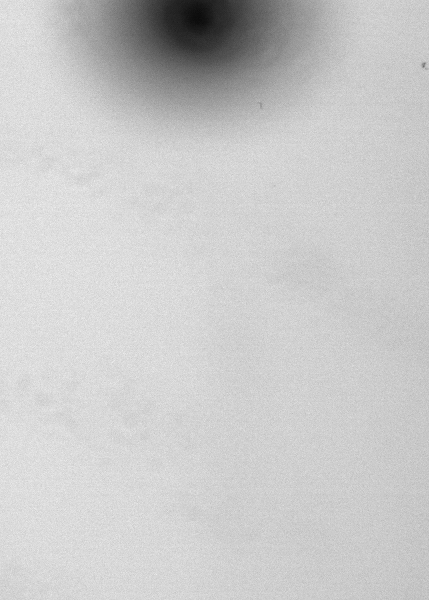

In [38]:
from PIL import Image

def crop_image(image_path, crop_box = (0, 0, 429, 600)):
    image = Image.open(image_path)
    cropped_image = image.crop(crop_box)
    return cropped_image

# Example usage:
image_path = "Data/DF_SALI_Heptane_2D/images/DF_SALI_Heptane_2D 429m43s.bmp"
cropped_image = crop_image(image_path)

# Display the cropped image
cropped_image.show()

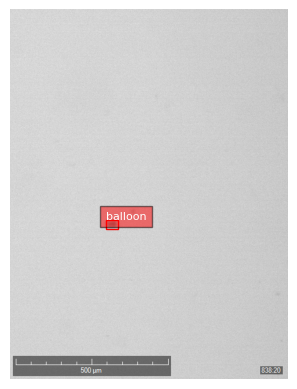

Segmentation Results Keys: dict_keys(['<REFERRING_EXPRESSION_SEGMENTATION> a regular crystal'])
Segmentation key '<REFERRING_EXPRESSION_SEGMENTATION>' not found in the results.


In [44]:
import os
import random
import numpy as np
import pandas as pd
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import torch
from transformers import AutoProcessor, AutoModelForCausalLM
from joblib import load

# Load Florence-2 model and processor
model_id = 'microsoft/Florence-2-large'
model = AutoModelForCausalLM.from_pretrained(model_id, trust_remote_code=True).eval().cuda()
processor = AutoProcessor.from_pretrained(model_id, trust_remote_code=True)

# Function to crop the ruler from the image
def crop_ruler(image):
    width, height = image.size
    return image.crop((0, 0, width, height - 50))  # Adjust the crop values as needed

# Function to run Florence-2 model for given image and task
def run_florence_model(image_path, task_prompt):
    image = Image.open(image_path)
    image = crop_ruler(image)  # Crop the ruler if present
    if image.mode != 'RGB':
        image = image.convert('RGB')
    inputs = processor(text=task_prompt, images=image, return_tensors="pt")
    generated_ids = model.generate(
        input_ids=inputs["input_ids"].cuda(),
        pixel_values=inputs["pixel_values"].cuda(),
        max_new_tokens=1024,
        early_stopping=False,
        do_sample=False,
        num_beams=3,
    )
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
    parsed_answer = processor.post_process_generation(
        generated_text, 
        task=task_prompt, 
        image_size=(image.width, image.height)
    )
    return parsed_answer

# Function to plot bounding boxes
def plot_bbox(image, data):
    fig, ax = plt.subplots()
    ax.imshow(image)
    for bbox, label in zip(data['bboxes'], data['labels']):
        x1, y1, x2, y2 = bbox
        rect = plt.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        plt.text(x1, y1, label, color='white', fontsize=8, bbox=dict(facecolor='red', alpha=0.5))
    ax.axis('off')
    plt.show()

# Function to draw polygons for segmentation
def draw_polygons(image, prediction, fill_mask=False):
    draw = ImageDraw.Draw(image)
    colormap = ['blue','orange','green','purple','brown','pink','gray','olive','cyan','red']
    for polygons, label in zip(prediction['polygons'], prediction['labels']):
        color = random.choice(colormap)
        fill_color = random.choice(colormap) if fill_mask else None
        for _polygon in polygons:
            _polygon = np.array(_polygon).reshape(-1, 2)
            if len(_polygon) < 3:
                continue
            _polygon = _polygon.reshape(-1).tolist()
            if fill_mask:
                draw.polygon(_polygon, outline=color, fill=fill_color)
            else:
                draw.polygon(_polygon, outline=color)
            draw.text((_polygon[0] + 8, _polygon[1] + 2), label, fill=color)
    image.show()

embeddings = load("Data/features.pkl")
labels = load("Data/labels.pkl")
image_paths = load("Data/image_paths.pkl")
# Convert labels to a NumPy array
labels = np.array(labels)

# Filter images by class (e.g., Regular crystal)
def filter_images_by_class(labels, class_index):
    filtered_indices = np.where(labels[:, class_index] == 1)[0]
    return filtered_indices

class_index = 4  # Example class index for 'Regular crystal'
regular_crystal_indices = filter_images_by_class(labels, class_index)
regular_crystal_paths = [image_paths[i] for i in regular_crystal_indices]

# Pick a random sample from the filtered images
random_sample_path = random.choice(regular_crystal_paths)

# Run Florence-2 model for object detection
task_prompt = '<OD>'
od_results = run_florence_model(random_sample_path, task_prompt)
plot_bbox(Image.open(random_sample_path), od_results['<OD>'])

# Run Florence-2 model for segmentation
task_prompt = '<REFERRING_EXPRESSION_SEGMENTATION>'
seg_results = run_florence_model(random_sample_path, task_prompt + " a regular crystal")

# Print the keys of the segmentation results
print("Segmentation Results Keys:", seg_results.keys())

# Draw segmentation results
seg_image = Image.open(random_sample_path)
if '<REFERRING_EXPRESSION_SEGMENTATION>' in seg_results:
    draw_polygons(seg_image, seg_results['<REFERRING_EXPRESSION_SEGMENTATION>'], fill_mask=True)
else:
    print("Segmentation key '<REFERRING_EXPRESSION_SEGMENTATION>' not found in the results.")


In [ ]:
import os
import random
import numpy as np
import pandas as pd
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import torch
from transformers import AutoProcessor, AutoModelForCausalLM
from joblib import load

# Load Florence-2 model and processor
model_id = 'microsoft/Florence-2-large'
model = AutoModelForCausalLM.from_pretrained(model_id, trust_remote_code=True).eval().cuda()
processor = AutoProcessor.from_pretrained(model_id, trust_remote_code=True)

# Function to run Florence-2 model for given image and task
def run_florence_model(image_path, task_prompt):
    image = Image.open(image_path)
    inputs = processor(text=task_prompt, images=image, return_tensors="pt")
    generated_ids = model.generate(
        input_ids=inputs["input_ids"].cuda(),
        pixel_values=inputs["pixel_values"].cuda(),
        max_new_tokens=1024,
        early_stopping=False,
        do_sample=False,
        num_beams=3,
    )
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
    parsed_answer = processor.post_process_generation(
        generated_text, 
        task=task_prompt, 
        image_size=(image.width, image.height)
    )
    return parsed_answer

# Function to plot bounding boxes
def plot_bbox(image, data):
    fig, ax = plt.subplots()
    ax.imshow(image)
    for bbox, label in zip(data['bboxes'], data['labels']):
        x1, y1, x2, y2 = bbox
        rect = plt.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='r', facecolor='none')
        ax.add_patch(rect)
        plt.text(x1, y1, label, color='white', fontsize=8, bbox=dict(facecolor='red', alpha=0.5))
    ax.axis('off')
    plt.show()

# Function to draw polygons for segmentation
def draw_polygons(image, prediction, fill_mask=False):
    draw = ImageDraw.Draw(image)
    colormap = ['blue','orange','green','purple','brown','pink','gray','olive','cyan','red']
    for polygons, label in zip(prediction['polygons'], prediction['labels']):
        color = random.choice(colormap)
        fill_color = random.choice(colormap) if fill_mask else None
        for _polygon in polygons:
            _polygon = np.array(_polygon).reshape(-1, 2)
            if len(_polygon) < 3:
                continue
            _polygon = _polygon.reshape(-1).tolist()
            if fill_mask:
                draw.polygon(_polygon, outline=color, fill=fill_color)
            else:
                draw.polygon(_polygon, outline=color)
            draw.text((_polygon[0] + 8, _polygon[1] + 2), label, fill=color)
    image.show()

# Load embeddings, labels, and image paths
embeddings = load("features.pkl")
labels = load("labels.pkl")
image_paths = load("image_paths.pkl")

# Filter images by class (e.g., Regular crystal)
def filter_images_by_class(labels, class_index):
    filtered_indices = np.where(labels[:, class_index] == 1)[0]
    return filtered_indices

class_index = 4  # Example class index for 'Regular crystal'
regular_crystal_indices = filter_images_by_class(labels, class_index)
regular_crystal_paths = [image_paths[i] for i in regular_crystal_indices]

# Pick a random sample from the filtered images
random_sample_path = random.choice(regular_crystal_paths)

# Run Florence-2 model for object detection
task_prompt = '<OD>'
od_results = run_florence_model(random_sample_path, task_prompt)
plot_bbox(Image.open(random_sample_path), od_results['<OD>'])

# Run Florence-2 model for segmentation
task_prompt = '<REFERRING_EXPRESSION_SEGMENTATION>'
seg_results = run_florence_model(random_sample_path, task_prompt + " a regular crystal")

# Draw segmentation results
seg_image = Image.open(random_sample_path)
draw_polygons(seg_image, seg_results['<REFERRING_EXPRESSION_SEGMENTATION>'], fill_mask=True)
